In [1]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import easydict

In [2]:
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [3]:
args = easydict.EasyDict({
    "dataroot":"/mnt/gold/users/s18150/mywork/pytorch/data/gan",
    "workers": 8,
    "batch_size": 128,
    "image_size": 64,
    "nc": 3,
    "nz": 100,
    "ngf": 64,
    "ndf": 64,
    "epochs": 5,
    "lr": 0.0002,
    "beta1": 0.5,
    "gpu": 9,
    "feature_matching": False
})

In [4]:
transform = transforms.Compose([
    transforms.Resize(args.image_size),
    transforms.CenterCrop(args.image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))    
])

In [5]:
dataset = dataset.ImageFolder(root=args.dataroot,transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=args.batch_size,
                                        shuffle=True, num_workers=args.workers)


In [6]:
device = torch.device('cuda:{}'.format(args.gpu) if (torch.cuda.is_available() and args.gpu > 0) else 'cpu')

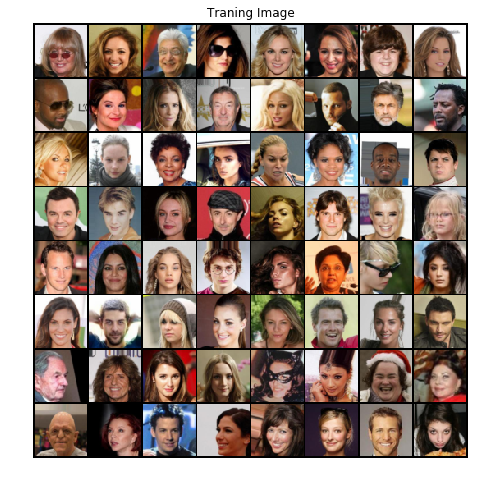

In [7]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis('off')
plt.title('Traning Image')
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64],
                       padding=2,normalize=True).cpu(),(1,2,0)))

In [7]:
# モデルの初期化用の関数
# DCGANによるとCNN層の初期値は、平均0、偏差0.2で乱数初期化
# BatchNormの部分が何故平均1になっているかは調査が必要

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [8]:
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
#         self.gpu = args.gpu

##upsampleinで得られる画像サイズ = (W - 1) x stride - 2xpadding + kernel + outputpadding

        self.model = nn.Sequential(
            # 乱数z, generatorのconv層への入力
            # 層の深さ ngfx8, kernel: 4, stride: 1, padding: 0
            # サイズ: (1-1)x 1 - 2x0 + 4 = 4
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            # 層の深さ ngfx4, kernel: 4, stride: 2, padding: 1
            # サイズ: (4-1)x 2 - 2x1 + 4 = 8
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),
            # 層の深さ ngfx2, kernel: 4, stride: 2, padding: 1
            # サイズ: (8-1)x 2 - 2x1 + 4 = 16
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            # 層の深さ ngfx2, kernel: 4, stride: 2, padding: 1
            # サイズ: (16-1)x 2 - 2x1 + 4 = 32
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # 層の深さ ngfx2, kernel: 4, stride: 2, padding: 1
            # サイズ: (32-1)x 2 - 2x1 + 4 = 64
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, input):
        return self.model(input)

In [9]:
## Generator用のモデルのインスタンス作成
netG = Generator(args.nz, args.ngf, args.nc).to(device)
## Generator用のモデルの初期値を設定
netG.apply(weights_init)

Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [10]:
class Discriminator(nn.Module):
    def __init__(self, nc, ndf):
        super(Discriminator, self).__init__()
        self.ndf = ndf
        self.model1 = nn.Sequential(
            # SIZE = (W + 2xpadding - kernel) / stride + 1      
            # nc x 64 x 64 >> (64 + 2x1 - 4)/2 +1 = 32
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 32 x 32 >> (32 + 2x1 - 4)/2 +1 = 16
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 16 x 16 >> (16 + 2x1 - 4)/2 +1 = 8
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 8 x 8 >> (8 + 2x1 - 4)/2 +1 = 4
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
        )
        
        self.model2 = nn.Sequential(        
            # (ndf) x 4 x 4 >> (4 + 2x0 - 4)/1 +1 = 1 >> 1つの値を出力
            nn.LeakyReLU(0.2, inplace=True),      
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()                
        )
        
    def forward(self, input, feature_matching = False):
        h = self.model1(input)
        output = self.model2(h)
        
        if feature_matching == True:
            feature = h.view(-1, self.ndf*8*4*4)
            return output, feature
        else:
            return output, 0
    

In [11]:
## Discriminator用のモデルのインスタンス作成
netD = Discriminator(args.nc, args.ndf).to(device)
## Discriminator用のモデルの初期値を設定
netD.apply(weights_init)

Discriminator(
  (model1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (model2): Sequential(
    (0): LeakyReLU(negative_slope=0.2, inplace)
    (1): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (2): Sigmoid()
  )
)

loss関数としてnn.BCELoss()を使用  
BCELoss()の中身は下記  
$loss(x,y) = L = {l_1, ..., l_N}$  
$l_n = -w_n [y_n \cdot \log x_n + (1 - y_n) \cdot \log(1 - x_n)]$  
$loss(x,y) = mean(L)$, if size_average = True  
$loss(x,y) = sum(L)$, if size_average = False  
$w_n$: weight parameter

In [12]:
# BCE Loss classのインスタンスを作成
criterionD = nn.BCELoss()

if args.feature_matching == True:
    criterionG = nn.MSELoss(reduction='elementwise_mean')
else:
    criterionG = nn.BCELoss()

# Generatorに入力するノイズをバッチごとに作成 (バッチ数は64)
# これはGeneratorの結果を描画するために使用する
fixed_noise = torch.randn(64, args.nz, 1, 1, device=device)

# real dataとface dataのラベルを作成
real_label = 1
fake_label = 0

# 最適化関数のインスタンスを作成
optimizerD = optim.Adam(netD.parameters(), lr=args.lr, betas=(args.beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=args.lr, betas=(args.beta1, 0.999))


In [20]:
img_list = []
G_losses = []
D_losses = []
iters = 0

for epoch in range(args.epochs):
    for i, data in enumerate(dataloader, 0):
        
        netD.zero_grad()
        real_data = data[0].to(device)
        batch_size = real_data.size(0)
        ''' <https://github.com/soumith/ganhacks によると、
        real dataとfakeデータを個別に学習する方が精度がよいとの検証結果があるため、
        このコードもその検証結果をフォローする'''
        
        ################# Discriminator の real dataを学習 #####################
        # real data の正解ラベルのベクトル をバッチサイズ分用意
        # 長さ batch size のベクトルをreal_label = 1 で埋める
        label = torch.full((batch_size,), real_label, device=device)
        # Discriminator のreal dataのforwardを計算
        output, feature_real = netD(real_data, args.feature_matching)
        output = output.view(-1)
        # Discriminator の real dataのlossを計算
        # cross entropy = -y log x - (1 - y) log(1 -x)
        # label はすべて1に設定しているため、fake dataのloss を表す２項目はすべて0になる
        errD_real = criterionD(output, label)
        # feature_mating のロス計算で再利用るため、retaing_graph=Trueにする
        errD_real.backward(retain_graph=True) 
#         errD_real.backward() 
        # Discriminatorの出力値の平均、ナッシュ均衡点は0.5
        D_x = output.mean().item()
        
        ################# Discriminator の fake dataを学習 #####################
        noise = torch.randn(batch_size, args.nz, 1, 1, device=device)
        # args.nzの長さの乱数のベクトルをGeneratorのネットワークに入力
        fake_data = netG(noise)
        # labelをすべてfake_labelで埋める、batch sizeはreal と fakeで同じサイズを前提
        label.fill_(fake_label)
        # Discriminator の fake data のforwardを計算
        # このときGeneratorは学習しないため、fake_dataのrequired_gradをすべてfalseにする
        output, _ = netD(fake_data.detach())
        output = output.view(-1)
        # Discriminator の fake dataのlossを計算
        # cross entropy = -y log x - (1 - y) log(1 -x)
        # label はすべて0に設定しているため、fake dataのloss を表す1項目はすべて0になる
        errD_fake = criterionD(output, label)
        errD_fake.backward()
        # Discriminatorの出力値の平均、ナッシュ均衡点は0.5
        D_G_z1 = output.mean().item()
        # Discriminatorのloss
        errD = errD_real - errD_fake
        # netDのパラメータを更新
        optimizerD.step()
        
        ################# Generator の fake dataを学習 #####################
        netG.zero_grad()
        # Generatorの場合、Discriminatorを騙すため、ラベルはすべて1(正解)で設定する
        # その時の log(D(G(z)))を最大化することがGeneratorの目的
        label.fill_(real_label)
        # 今度はfake_dataをdetachしない
#         if args.feature_matching == True:
#             _, feature_real = netD(real_data.detach(), args.feature_matching)
        output, feature_fake = netD(fake_data, args.feature_matching)
        # Generatorのlossを計算、Generatorの目的は (1 - log(D(G(z))))を最小化すること
        # しかし通常勾配消失が生じてうまく学習できない
        # そのため、log()D(G(z))を最大化することを目的とする
        # そのため、labelを1にセットし、cross entropy の第一項を使用する
        
        if args.feature_matching == True:
            feature_real = torch.mean(feature_real,0)
            feature_fake = torch.mean(feature_fake, 0)
            errG = criterionG(feature_real.detach(), feature_fake)
        else:
            errG = criterionG(output, label)
            
        errG.backward()
        D_G_z2 = output.mean().item()
        # netGのパラメータを更新
        optimizerG.step()
        
        if i % 50:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, args.epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))        
        
        # ロスを保存
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (iters % 500 == 0) or ((epoch == args.epochs - 1) and (i == len(dataloader) - 1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
        
        iters += 1
        

/usr/local/lib/python3.5/dist-packages/torch/nn/functional.py:1594: UserWarning: Using a target size (torch.Size([128])) that is different to the input size (torch.Size([128, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  "Please ensure they have the same size.".format(target.size(), input.size()))


[0/5][1/1583]	Loss_D: 1.3205	Loss_G: 0.6750	D(x): 0.3882	D(G(z)): 0.0939 / 0.5639
[0/5][2/1583]	Loss_D: -1.8562	Loss_G: 2.0245	D(x): 0.8845	D(G(z)): 0.7692 / 0.2158
[0/5][3/1583]	Loss_D: -0.6518	Loss_G: 2.4726	D(x): 0.4806	D(G(z)): 0.7001 / 0.1548
[0/5][4/1583]	Loss_D: 0.7670	Loss_G: 1.8913	D(x): 0.3648	D(G(z)): 0.3798 / 0.2120
[0/5][5/1583]	Loss_D: -0.0285	Loss_G: 1.8819	D(x): 0.4935	D(G(z)): 0.5412 / 0.2190
[0/5][6/1583]	Loss_D: -0.1467	Loss_G: 2.3218	D(x): 0.5414	D(G(z)): 0.5211 / 0.1488
[0/5][7/1583]	Loss_D: 0.2369	Loss_G: 2.1379	D(x): 0.4501	D(G(z)): 0.4912 / 0.1718
[0/5][8/1583]	Loss_D: -0.2239	Loss_G: 2.6748	D(x): 0.6017	D(G(z)): 0.4765 / 0.1178
[0/5][9/1583]	Loss_D: 0.0326	Loss_G: 2.7565	D(x): 0.5773	D(G(z)): 0.4220 / 0.1009
[0/5][10/1583]	Loss_D: 0.2555	Loss_G: 2.2685	D(x): 0.5673	D(G(z)): 0.3283 / 0.1513
[0/5][11/1583]	Loss_D: -0.7279	Loss_G: 4.2841	D(x): 0.7473	D(G(z)): 0.5898 / 0.0250
[0/5][12/1583]	Loss_D: 0.7709	Loss_G: 2.2519	D(x): 0.4807	D(G(z)): 0.1746 / 0.1570
[0/5][1

[0/5][104/1583]	Loss_D: 0.9005	Loss_G: 4.4508	D(x): 0.5102	D(G(z)): 0.0223 / 0.0325
[0/5][105/1583]	Loss_D: 0.0576	Loss_G: 2.8004	D(x): 0.7623	D(G(z)): 0.2212 / 0.1005
[0/5][106/1583]	Loss_D: -0.6180	Loss_G: 6.4655	D(x): 0.9392	D(G(z)): 0.4022 / 0.0045
[0/5][107/1583]	Loss_D: 0.6562	Loss_G: 3.4965	D(x): 0.6026	D(G(z)): 0.0346 / 0.0684
[0/5][108/1583]	Loss_D: -0.3188	Loss_G: 4.6427	D(x): 0.8982	D(G(z)): 0.2908 / 0.0207
[0/5][109/1583]	Loss_D: 0.0876	Loss_G: 4.4840	D(x): 0.8089	D(G(z)): 0.1644 / 0.0236
[0/5][110/1583]	Loss_D: 0.1285	Loss_G: 3.8611	D(x): 0.7787	D(G(z)): 0.1618 / 0.0408
[0/5][111/1583]	Loss_D: 0.0410	Loss_G: 3.8912	D(x): 0.7867	D(G(z)): 0.1881 / 0.0377
[0/5][112/1583]	Loss_D: -0.1022	Loss_G: 4.7708	D(x): 0.8342	D(G(z)): 0.2306 / 0.0153
[0/5][113/1583]	Loss_D: -0.0131	Loss_G: 4.9151	D(x): 0.8624	D(G(z)): 0.1360 / 0.0137
[0/5][114/1583]	Loss_D: 0.2644	Loss_G: 3.0429	D(x): 0.6864	D(G(z)): 0.1582 / 0.0887
[0/5][115/1583]	Loss_D: -0.3981	Loss_G: 6.2965	D(x): 0.9561	D(G(z)): 0.3

[0/5][204/1583]	Loss_D: -0.3557	Loss_G: 5.0556	D(x): 0.9322	D(G(z)): 0.3008 / 0.0121
[0/5][205/1583]	Loss_D: 0.0327	Loss_G: 4.7785	D(x): 0.8524	D(G(z)): 0.1180 / 0.0167
[0/5][206/1583]	Loss_D: 0.3220	Loss_G: 2.4562	D(x): 0.7134	D(G(z)): 0.0950 / 0.1557
[0/5][207/1583]	Loss_D: -0.5547	Loss_G: 6.6844	D(x): 0.9589	D(G(z)): 0.3861 / 0.0021
[0/5][208/1583]	Loss_D: 0.5376	Loss_G: 3.5141	D(x): 0.6350	D(G(z)): 0.0263 / 0.0599
[0/5][209/1583]	Loss_D: -0.1162	Loss_G: 3.4613	D(x): 0.9278	D(G(z)): 0.1578 / 0.0510
[0/5][210/1583]	Loss_D: -0.2183	Loss_G: 5.2030	D(x): 0.8850	D(G(z)): 0.2564 / 0.0099
[0/5][211/1583]	Loss_D: 0.1771	Loss_G: 3.7155	D(x): 0.7941	D(G(z)): 0.0853 / 0.0416
[0/5][212/1583]	Loss_D: -0.0091	Loss_G: 3.4624	D(x): 0.8208	D(G(z)): 0.1733 / 0.0545
[0/5][213/1583]	Loss_D: -0.1928	Loss_G: 5.1476	D(x): 0.8836	D(G(z)): 0.2486 / 0.0101
[0/5][214/1583]	Loss_D: 0.2728	Loss_G: 3.2794	D(x): 0.7336	D(G(z)): 0.1056 / 0.0641
[0/5][215/1583]	Loss_D: -0.1739	Loss_G: 4.5295	D(x): 0.8671	D(G(z)): 0

[0/5][304/1583]	Loss_D: 0.5460	Loss_G: 1.4438	D(x): 0.6074	D(G(z)): 0.0938 / 0.3248
[0/5][305/1583]	Loss_D: -1.0127	Loss_G: 7.8441	D(x): 0.9528	D(G(z)): 0.5743 / 0.0009
[0/5][306/1583]	Loss_D: 0.7356	Loss_G: 3.9365	D(x): 0.5756	D(G(z)): 0.0101 / 0.0525
[0/5][307/1583]	Loss_D: 0.1497	Loss_G: 1.2087	D(x): 0.7190	D(G(z)): 0.1819 / 0.3833
[0/5][308/1583]	Loss_D: -1.1997	Loss_G: 9.0068	D(x): 0.9832	D(G(z)): 0.6030 / 0.0003
[0/5][309/1583]	Loss_D: 1.2777	Loss_G: 2.5540	D(x): 0.3771	D(G(z)): 0.0072 / 0.1540
[0/5][310/1583]	Loss_D: -0.5335	Loss_G: 4.1316	D(x): 0.9616	D(G(z)): 0.3524 / 0.0276
[0/5][311/1583]	Loss_D: 0.0375	Loss_G: 3.9537	D(x): 0.7903	D(G(z)): 0.1899 / 0.0371
[0/5][312/1583]	Loss_D: -0.0280	Loss_G: 3.8800	D(x): 0.7427	D(G(z)): 0.2584 / 0.0444
[0/5][313/1583]	Loss_D: -0.0362	Loss_G: 4.4239	D(x): 0.7685	D(G(z)): 0.2548 / 0.0188
[0/5][314/1583]	Loss_D: 0.4129	Loss_G: 2.4657	D(x): 0.6885	D(G(z)): 0.0606 / 0.1232
[0/5][315/1583]	Loss_D: -0.5933	Loss_G: 6.8289	D(x): 0.9526	D(G(z)): 0.

[0/5][404/1583]	Loss_D: 0.6429	Loss_G: 2.0630	D(x): 0.5680	D(G(z)): 0.0737 / 0.2008
[0/5][405/1583]	Loss_D: -0.5912	Loss_G: 5.8048	D(x): 0.9413	D(G(z)): 0.4083 / 0.0050
[0/5][406/1583]	Loss_D: 0.5002	Loss_G: 2.9928	D(x): 0.6485	D(G(z)): 0.0462 / 0.0851
[0/5][407/1583]	Loss_D: -0.4309	Loss_G: 4.8396	D(x): 0.8995	D(G(z)): 0.3654 / 0.0132
[0/5][408/1583]	Loss_D: 0.3144	Loss_G: 2.7166	D(x): 0.6865	D(G(z)): 0.1182 / 0.1004
[0/5][409/1583]	Loss_D: -0.1342	Loss_G: 3.9180	D(x): 0.8874	D(G(z)): 0.2045 / 0.0288
[0/5][410/1583]	Loss_D: -0.0875	Loss_G: 4.1771	D(x): 0.7822	D(G(z)): 0.2649 / 0.0256
[0/5][411/1583]	Loss_D: 0.1208	Loss_G: 3.3990	D(x): 0.7717	D(G(z)): 0.1543 / 0.0535
[0/5][412/1583]	Loss_D: -0.0606	Loss_G: 4.1962	D(x): 0.8448	D(G(z)): 0.1954 / 0.0263
[0/5][413/1583]	Loss_D: 0.1328	Loss_G: 3.1062	D(x): 0.7695	D(G(z)): 0.1498 / 0.0695
[0/5][414/1583]	Loss_D: -0.3396	Loss_G: 6.0225	D(x): 0.8213	D(G(z)): 0.3825 / 0.0040
[0/5][415/1583]	Loss_D: 0.4806	Loss_G: 2.8459	D(x): 0.6510	D(G(z)): 0.

[0/5][504/1583]	Loss_D: -0.5224	Loss_G: 4.9377	D(x): 0.9640	D(G(z)): 0.3844 / 0.0132
[0/5][505/1583]	Loss_D: -0.0231	Loss_G: 4.6426	D(x): 0.8733	D(G(z)): 0.1448 / 0.0186
[0/5][506/1583]	Loss_D: 0.2369	Loss_G: 2.4129	D(x): 0.7487	D(G(z)): 0.1031 / 0.1390
[0/5][507/1583]	Loss_D: -0.3462	Loss_G: 3.9548	D(x): 0.8599	D(G(z)): 0.3395 / 0.0309
[0/5][508/1583]	Loss_D: -0.1830	Loss_G: 5.3105	D(x): 0.8639	D(G(z)): 0.2585 / 0.0084
[0/5][509/1583]	Loss_D: 0.7943	Loss_G: 1.0689	D(x): 0.4913	D(G(z)): 0.0776 / 0.4306
[0/5][510/1583]	Loss_D: -1.1890	Loss_G: 7.6025	D(x): 0.8975	D(G(z)): 0.6441 / 0.0013
[0/5][511/1583]	Loss_D: 1.0167	Loss_G: 1.9004	D(x): 0.4420	D(G(z)): 0.0054 / 0.2460
[0/5][512/1583]	Loss_D: -0.8997	Loss_G: 7.1192	D(x): 0.9560	D(G(z)): 0.5153 / 0.0018
[0/5][513/1583]	Loss_D: 0.5472	Loss_G: 3.5339	D(x): 0.6500	D(G(z)): 0.0200 / 0.0545
[0/5][514/1583]	Loss_D: -0.0925	Loss_G: 2.7707	D(x): 0.9010	D(G(z)): 0.1628 / 0.0985
[0/5][515/1583]	Loss_D: -0.4402	Loss_G: 5.3717	D(x): 0.9513	D(G(z)): 

[0/5][604/1583]	Loss_D: -0.0940	Loss_G: 3.7708	D(x): 0.8338	D(G(z)): 0.2359 / 0.0329
[0/5][605/1583]	Loss_D: -0.0865	Loss_G: 4.2521	D(x): 0.8637	D(G(z)): 0.1953 / 0.0226
[0/5][606/1583]	Loss_D: 0.3516	Loss_G: 2.0354	D(x): 0.6781	D(G(z)): 0.0890 / 0.1925
[0/5][607/1583]	Loss_D: -0.6942	Loss_G: 5.8981	D(x): 0.9175	D(G(z)): 0.4581 / 0.0054
[0/5][608/1583]	Loss_D: 0.8089	Loss_G: 2.3846	D(x): 0.5197	D(G(z)): 0.0228 / 0.1364
[0/5][609/1583]	Loss_D: -0.3942	Loss_G: 3.9621	D(x): 0.8885	D(G(z)): 0.3494 / 0.0322
[0/5][610/1583]	Loss_D: 0.0782	Loss_G: 3.5355	D(x): 0.8000	D(G(z)): 0.1532 / 0.0447
[0/5][611/1583]	Loss_D: 0.0354	Loss_G: 3.1486	D(x): 0.8449	D(G(z)): 0.1407 / 0.0653
[0/5][612/1583]	Loss_D: -0.2227	Loss_G: 4.4718	D(x): 0.8476	D(G(z)): 0.3114 / 0.0157
[0/5][613/1583]	Loss_D: 0.3479	Loss_G: 2.9335	D(x): 0.7073	D(G(z)): 0.0575 / 0.0875
[0/5][614/1583]	Loss_D: -0.1514	Loss_G: 3.3086	D(x): 0.8526	D(G(z)): 0.2445 / 0.0574
[0/5][615/1583]	Loss_D: -0.0687	Loss_G: 4.2798	D(x): 0.8364	D(G(z)): 0

[0/5][704/1583]	Loss_D: 0.1665	Loss_G: 3.3464	D(x): 0.7282	D(G(z)): 0.1685 / 0.0538
[0/5][705/1583]	Loss_D: -0.0348	Loss_G: 3.4095	D(x): 0.8532	D(G(z)): 0.1747 / 0.0487
[0/5][706/1583]	Loss_D: 0.1773	Loss_G: 2.4370	D(x): 0.7703	D(G(z)): 0.1000 / 0.1276
[0/5][707/1583]	Loss_D: -0.4340	Loss_G: 4.9236	D(x): 0.9008	D(G(z)): 0.3785 / 0.0112
[0/5][708/1583]	Loss_D: 0.7215	Loss_G: 1.6199	D(x): 0.5392	D(G(z)): 0.0362 / 0.2711
[0/5][709/1583]	Loss_D: -0.5313	Loss_G: 4.5653	D(x): 0.9565	D(G(z)): 0.3946 / 0.0156
[0/5][710/1583]	Loss_D: 0.1654	Loss_G: 3.3990	D(x): 0.7765	D(G(z)): 0.1239 / 0.0551
[0/5][711/1583]	Loss_D: 0.1458	Loss_G: 2.6104	D(x): 0.7814	D(G(z)): 0.1172 / 0.1126
[0/5][712/1583]	Loss_D: -0.1813	Loss_G: 3.7472	D(x): 0.8716	D(G(z)): 0.2498 / 0.0379
[0/5][713/1583]	Loss_D: 0.0071	Loss_G: 3.6689	D(x): 0.8506	D(G(z)): 0.1483 / 0.0367
[0/5][714/1583]	Loss_D: 0.3143	Loss_G: 1.6657	D(x): 0.6695	D(G(z)): 0.1252 / 0.2403
[0/5][715/1583]	Loss_D: -0.6025	Loss_G: 4.9959	D(x): 0.9042	D(G(z)): 0.4

[0/5][804/1583]	Loss_D: -1.2714	Loss_G: 6.9261	D(x): 0.9790	D(G(z)): 0.6413 / 0.0022
[0/5][805/1583]	Loss_D: 0.9115	Loss_G: 2.3095	D(x): 0.4927	D(G(z)): 0.0203 / 0.1547
[0/5][806/1583]	Loss_D: -0.2569	Loss_G: 3.7310	D(x): 0.9427	D(G(z)): 0.2447 / 0.0364
[0/5][807/1583]	Loss_D: -0.2633	Loss_G: 5.2266	D(x): 0.8935	D(G(z)): 0.2715 / 0.0100
[0/5][808/1583]	Loss_D: 0.5169	Loss_G: 1.9943	D(x): 0.6159	D(G(z)): 0.0569 / 0.1977
[0/5][809/1583]	Loss_D: -0.7612	Loss_G: 6.2768	D(x): 0.9363	D(G(z)): 0.4921 / 0.0036
[0/5][810/1583]	Loss_D: 0.7513	Loss_G: 1.9400	D(x): 0.5351	D(G(z)): 0.0341 / 0.2302
[0/5][811/1583]	Loss_D: -0.7258	Loss_G: 5.5082	D(x): 0.9607	D(G(z)): 0.4596 / 0.0067
[0/5][812/1583]	Loss_D: 0.6904	Loss_G: 2.3241	D(x): 0.5751	D(G(z)): 0.0529 / 0.1521
[0/5][813/1583]	Loss_D: -0.3571	Loss_G: 3.9586	D(x): 0.8704	D(G(z)): 0.3488 / 0.0318
[0/5][814/1583]	Loss_D: 0.2148	Loss_G: 2.6172	D(x): 0.7012	D(G(z)): 0.1689 / 0.1094
[0/5][815/1583]	Loss_D: -0.3122	Loss_G: 4.5020	D(x): 0.8535	D(G(z)): 0

[0/5][904/1583]	Loss_D: 0.8113	Loss_G: 1.8823	D(x): 0.4924	D(G(z)): 0.0245 / 0.2153
[0/5][905/1583]	Loss_D: -0.5993	Loss_G: 4.1940	D(x): 0.9181	D(G(z)): 0.4416 / 0.0230
[0/5][906/1583]	Loss_D: 0.4484	Loss_G: 2.4717	D(x): 0.6453	D(G(z)): 0.0868 / 0.1286
[0/5][907/1583]	Loss_D: -0.2569	Loss_G: 3.6485	D(x): 0.8675	D(G(z)): 0.3035 / 0.0388
[0/5][908/1583]	Loss_D: 0.2489	Loss_G: 2.3529	D(x): 0.6788	D(G(z)): 0.1679 / 0.1426
[0/5][909/1583]	Loss_D: -0.2204	Loss_G: 3.2332	D(x): 0.8259	D(G(z)): 0.3172 / 0.0550
[0/5][910/1583]	Loss_D: 0.0334	Loss_G: 3.2431	D(x): 0.8034	D(G(z)): 0.1732 / 0.0572
[0/5][911/1583]	Loss_D: 0.2270	Loss_G: 1.8087	D(x): 0.6559	D(G(z)): 0.2142 / 0.2039
[0/5][912/1583]	Loss_D: -0.5964	Loss_G: 5.5142	D(x): 0.8572	D(G(z)): 0.4706 / 0.0063
[0/5][913/1583]	Loss_D: 0.9511	Loss_G: 1.2636	D(x): 0.4667	D(G(z)): 0.0247 / 0.3685
[0/5][914/1583]	Loss_D: -0.9294	Loss_G: 5.6421	D(x): 0.9613	D(G(z)): 0.5313 / 0.0064
[0/5][915/1583]	Loss_D: 0.7603	Loss_G: 1.5351	D(x): 0.5328	D(G(z)): 0.0

[0/5][1004/1583]	Loss_D: -1.1804	Loss_G: 5.2835	D(x): 0.8800	D(G(z)): 0.6602 / 0.0092
[0/5][1005/1583]	Loss_D: 0.9611	Loss_G: 2.2925	D(x): 0.4645	D(G(z)): 0.0629 / 0.1595
[0/5][1006/1583]	Loss_D: -0.4921	Loss_G: 3.9200	D(x): 0.9159	D(G(z)): 0.3890 / 0.0331
[0/5][1007/1583]	Loss_D: 0.1647	Loss_G: 2.8691	D(x): 0.6523	D(G(z)): 0.2552 / 0.0807
[0/5][1008/1583]	Loss_D: 0.0572	Loss_G: 2.7386	D(x): 0.7328	D(G(z)): 0.2356 / 0.0980
[0/5][1009/1583]	Loss_D: -0.2844	Loss_G: 4.2320	D(x): 0.7795	D(G(z)): 0.3991 / 0.0211
[0/5][1010/1583]	Loss_D: 0.7180	Loss_G: 1.5451	D(x): 0.4973	D(G(z)): 0.1515 / 0.2731
[0/5][1011/1583]	Loss_D: -0.4697	Loss_G: 4.6092	D(x): 0.8687	D(G(z)): 0.4175 / 0.0160
[0/5][1012/1583]	Loss_D: 0.0209	Loss_G: 4.4946	D(x): 0.8712	D(G(z)): 0.1098 / 0.0184
[0/5][1013/1583]	Loss_D: 0.4757	Loss_G: 1.6594	D(x): 0.6333	D(G(z)): 0.0634 / 0.2566
[0/5][1014/1583]	Loss_D: -0.5131	Loss_G: 4.4356	D(x): 0.9199	D(G(z)): 0.3949 / 0.0191
[0/5][1015/1583]	Loss_D: -0.0751	Loss_G: 4.5763	D(x): 0.8364

[0/5][1104/1583]	Loss_D: -0.0656	Loss_G: 2.2732	D(x): 0.8096	D(G(z)): 0.2409 / 0.1355
[0/5][1105/1583]	Loss_D: -0.3093	Loss_G: 4.6075	D(x): 0.8642	D(G(z)): 0.3285 / 0.0156
[0/5][1106/1583]	Loss_D: 0.5751	Loss_G: 1.5288	D(x): 0.5941	D(G(z)): 0.0732 / 0.2807
[0/5][1107/1583]	Loss_D: -0.6043	Loss_G: 4.8742	D(x): 0.8957	D(G(z)): 0.4625 / 0.0114
[0/5][1108/1583]	Loss_D: 0.5240	Loss_G: 2.3815	D(x): 0.6001	D(G(z)): 0.0646 / 0.1310
[0/5][1109/1583]	Loss_D: -0.0926	Loss_G: 2.5637	D(x): 0.7482	D(G(z)): 0.3188 / 0.1003
[0/5][1110/1583]	Loss_D: -0.1862	Loss_G: 3.8966	D(x): 0.8529	D(G(z)): 0.2727 / 0.0311
[0/5][1111/1583]	Loss_D: 0.2010	Loss_G: 2.7745	D(x): 0.7678	D(G(z)): 0.0963 / 0.0945
[0/5][1112/1583]	Loss_D: -0.1631	Loss_G: 3.4002	D(x): 0.8719	D(G(z)): 0.2351 / 0.0506
[0/5][1113/1583]	Loss_D: 0.2355	Loss_G: 1.9539	D(x): 0.6870	D(G(z)): 0.1663 / 0.1862
[0/5][1114/1583]	Loss_D: -0.4386	Loss_G: 4.5896	D(x): 0.8904	D(G(z)): 0.3863 / 0.0144
[0/5][1115/1583]	Loss_D: 0.4348	Loss_G: 2.5015	D(x): 0.655

[0/5][1204/1583]	Loss_D: -0.7044	Loss_G: 5.0562	D(x): 0.9426	D(G(z)): 0.4742 / 0.0098
[0/5][1205/1583]	Loss_D: 0.5225	Loss_G: 2.8342	D(x): 0.6269	D(G(z)): 0.0538 / 0.0945
[0/5][1206/1583]	Loss_D: -0.1451	Loss_G: 2.7390	D(x): 0.8031	D(G(z)): 0.2797 / 0.0972
[0/5][1207/1583]	Loss_D: -0.2320	Loss_G: 4.2342	D(x): 0.8553	D(G(z)): 0.2948 / 0.0225
[0/5][1208/1583]	Loss_D: 0.5882	Loss_G: 1.7328	D(x): 0.5636	D(G(z)): 0.1113 / 0.2384
[0/5][1209/1583]	Loss_D: -0.4574	Loss_G: 3.8453	D(x): 0.8745	D(G(z)): 0.4017 / 0.0321
[0/5][1210/1583]	Loss_D: 0.1819	Loss_G: 3.0201	D(x): 0.7368	D(G(z)): 0.1552 / 0.0710
[0/5][1211/1583]	Loss_D: 0.0287	Loss_G: 2.4797	D(x): 0.7663	D(G(z)): 0.2230 / 0.1114
[0/5][1212/1583]	Loss_D: -0.2274	Loss_G: 4.0065	D(x): 0.8953	D(G(z)): 0.2557 / 0.0263
[0/5][1213/1583]	Loss_D: 0.2061	Loss_G: 2.5767	D(x): 0.7329	D(G(z)): 0.1333 / 0.1088
[0/5][1214/1583]	Loss_D: -0.2107	Loss_G: 3.5724	D(x): 0.8672	D(G(z)): 0.2794 / 0.0381
[0/5][1215/1583]	Loss_D: 0.5727	Loss_G: 1.2432	D(x): 0.5491

[0/5][1304/1583]	Loss_D: 0.3105	Loss_G: 1.3933	D(x): 0.6876	D(G(z)): 0.1199 / 0.3109
[0/5][1305/1583]	Loss_D: -0.8094	Loss_G: 5.2283	D(x): 0.8936	D(G(z)): 0.5339 / 0.0087
[0/5][1306/1583]	Loss_D: 0.9273	Loss_G: 1.5975	D(x): 0.4506	D(G(z)): 0.0419 / 0.2754
[0/5][1307/1583]	Loss_D: -0.5090	Loss_G: 3.6944	D(x): 0.9314	D(G(z)): 0.3976 / 0.0381
[0/5][1308/1583]	Loss_D: -0.0261	Loss_G: 3.7439	D(x): 0.8308	D(G(z)): 0.1783 / 0.0398
[0/5][1309/1583]	Loss_D: 0.2023	Loss_G: 2.4425	D(x): 0.7212	D(G(z)): 0.1538 / 0.1400
[0/5][1310/1583]	Loss_D: -0.0906	Loss_G: 3.0656	D(x): 0.8500	D(G(z)): 0.2185 / 0.0705
[0/5][1311/1583]	Loss_D: 0.0265	Loss_G: 2.7421	D(x): 0.7686	D(G(z)): 0.2173 / 0.0870
[0/5][1312/1583]	Loss_D: -0.1805	Loss_G: 3.8287	D(x): 0.8349	D(G(z)): 0.2757 / 0.0320
[0/5][1313/1583]	Loss_D: 0.4081	Loss_G: 2.0283	D(x): 0.6403	D(G(z)): 0.1117 / 0.1882
[0/5][1314/1583]	Loss_D: -0.2343	Loss_G: 3.3421	D(x): 0.8623	D(G(z)): 0.2909 / 0.0487
[0/5][1315/1583]	Loss_D: 0.0190	Loss_G: 3.1251	D(x): 0.7653

[0/5][1404/1583]	Loss_D: 0.8480	Loss_G: 1.2509	D(x): 0.4859	D(G(z)): 0.0493 / 0.3523
[0/5][1405/1583]	Loss_D: -0.7240	Loss_G: 4.4932	D(x): 0.9480	D(G(z)): 0.4733 / 0.0170
[0/5][1406/1583]	Loss_D: 0.1676	Loss_G: 3.5248	D(x): 0.7503	D(G(z)): 0.1412 / 0.0427
[0/5][1407/1583]	Loss_D: 0.2749	Loss_G: 1.9190	D(x): 0.7084	D(G(z)): 0.1131 / 0.1990
[0/5][1408/1583]	Loss_D: -0.6384	Loss_G: 5.6050	D(x): 0.9143	D(G(z)): 0.4619 / 0.0060
[0/5][1409/1583]	Loss_D: 0.6628	Loss_G: 2.2349	D(x): 0.5672	D(G(z)): 0.0320 / 0.1735
[0/5][1410/1583]	Loss_D: -0.2747	Loss_G: 3.0695	D(x): 0.8376	D(G(z)): 0.3321 / 0.0621
[0/5][1411/1583]	Loss_D: -0.0397	Loss_G: 3.5008	D(x): 0.7976	D(G(z)): 0.2416 / 0.0439
[0/5][1412/1583]	Loss_D: 0.3751	Loss_G: 1.3406	D(x): 0.6440	D(G(z)): 0.1195 / 0.3063
[0/5][1413/1583]	Loss_D: -1.0159	Loss_G: 6.1901	D(x): 0.9243	D(G(z)): 0.5936 / 0.0037
[0/5][1414/1583]	Loss_D: 1.2331	Loss_G: 0.6587	D(x): 0.3785	D(G(z)): 0.0191 / 0.5677
[0/5][1415/1583]	Loss_D: -1.1865	Loss_G: 5.4029	D(x): 0.9224

[0/5][1504/1583]	Loss_D: 0.3265	Loss_G: 2.5165	D(x): 0.5986	D(G(z)): 0.2237 / 0.1114
[0/5][1505/1583]	Loss_D: 0.1363	Loss_G: 1.8694	D(x): 0.6918	D(G(z)): 0.2329 / 0.2027
[0/5][1506/1583]	Loss_D: -0.4787	Loss_G: 4.4670	D(x): 0.8490	D(G(z)): 0.4219 / 0.0171
[0/5][1507/1583]	Loss_D: 0.5303	Loss_G: 2.0799	D(x): 0.5805	D(G(z)): 0.1140 / 0.1871
[0/5][1508/1583]	Loss_D: -0.2187	Loss_G: 3.2611	D(x): 0.8609	D(G(z)): 0.2795 / 0.0561
[0/5][1509/1583]	Loss_D: -0.1059	Loss_G: 3.5424	D(x): 0.8344	D(G(z)): 0.2391 / 0.0400
[0/5][1510/1583]	Loss_D: 0.0850	Loss_G: 3.0203	D(x): 0.7745	D(G(z)): 0.1692 / 0.0720
[0/5][1511/1583]	Loss_D: 0.2749	Loss_G: 1.5510	D(x): 0.6614	D(G(z)): 0.1848 / 0.2565
[0/5][1512/1583]	Loss_D: -0.6862	Loss_G: 5.2525	D(x): 0.9451	D(G(z)): 0.4775 / 0.0077
[0/5][1513/1583]	Loss_D: 1.0457	Loss_G: 1.5316	D(x): 0.4115	D(G(z)): 0.0467 / 0.2948
[0/5][1514/1583]	Loss_D: -0.5798	Loss_G: 3.5876	D(x): 0.9132	D(G(z)): 0.4443 / 0.0414
[0/5][1515/1583]	Loss_D: 0.1774	Loss_G: 2.8973	D(x): 0.7145	

/usr/local/lib/python3.5/dist-packages/torch/nn/functional.py:1594: UserWarning: Using a target size (torch.Size([103])) that is different to the input size (torch.Size([103, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  "Please ensure they have the same size.".format(target.size(), input.size()))


[1/5][1/1583]	Loss_D: 0.1344	Loss_G: 2.8427	D(x): 0.7397	D(G(z)): 0.1818 / 0.0804
[1/5][2/1583]	Loss_D: 0.0270	Loss_G: 2.5105	D(x): 0.7700	D(G(z)): 0.2098 / 0.1098
[1/5][3/1583]	Loss_D: -0.1925	Loss_G: 3.6724	D(x): 0.8697	D(G(z)): 0.2635 / 0.0355
[1/5][4/1583]	Loss_D: 0.2455	Loss_G: 2.3025	D(x): 0.7245	D(G(z)): 0.1075 / 0.1417
[1/5][5/1583]	Loss_D: -0.3013	Loss_G: 3.8630	D(x): 0.8539	D(G(z)): 0.3439 / 0.0295
[1/5][6/1583]	Loss_D: 0.3451	Loss_G: 2.2225	D(x): 0.6722	D(G(z)): 0.1145 / 0.1413
[1/5][7/1583]	Loss_D: -0.2320	Loss_G: 3.4691	D(x): 0.8264	D(G(z)): 0.3123 / 0.0461
[1/5][8/1583]	Loss_D: 0.2232	Loss_G: 2.4201	D(x): 0.7000	D(G(z)): 0.1618 / 0.1258
[1/5][9/1583]	Loss_D: -0.1529	Loss_G: 3.2175	D(x): 0.8548	D(G(z)): 0.2563 / 0.0566
[1/5][10/1583]	Loss_D: -0.0008	Loss_G: 3.1406	D(x): 0.7795	D(G(z)): 0.2200 / 0.0590
[1/5][11/1583]	Loss_D: 0.0065	Loss_G: 3.2648	D(x): 0.8274	D(G(z)): 0.1700 / 0.0551
[1/5][12/1583]	Loss_D: 0.1740	Loss_G: 2.1812	D(x): 0.7405	D(G(z)): 0.1302 / 0.1504
[1/5][13

[1/5][104/1583]	Loss_D: -0.2536	Loss_G: 3.0894	D(x): 0.8443	D(G(z)): 0.3145 / 0.0621
[1/5][105/1583]	Loss_D: 0.0338	Loss_G: 2.8514	D(x): 0.7577	D(G(z)): 0.2261 / 0.0741
[1/5][106/1583]	Loss_D: 0.0618	Loss_G: 2.5572	D(x): 0.7814	D(G(z)): 0.1728 / 0.1007
[1/5][107/1583]	Loss_D: -0.1571	Loss_G: 3.4793	D(x): 0.7949	D(G(z)): 0.2987 / 0.0444
[1/5][108/1583]	Loss_D: 0.1161	Loss_G: 2.8760	D(x): 0.7393	D(G(z)): 0.1829 / 0.0816
[1/5][109/1583]	Loss_D: 0.0424	Loss_G: 2.5166	D(x): 0.7645	D(G(z)): 0.2047 / 0.1114
[1/5][110/1583]	Loss_D: -0.1667	Loss_G: 3.8943	D(x): 0.8232	D(G(z)): 0.2944 / 0.0290
[1/5][111/1583]	Loss_D: 0.3004	Loss_G: 2.3608	D(x): 0.6956	D(G(z)): 0.1111 / 0.1327
[1/5][112/1583]	Loss_D: -0.3298	Loss_G: 3.9733	D(x): 0.9012	D(G(z)): 0.3120 / 0.0260
[1/5][113/1583]	Loss_D: 0.2633	Loss_G: 2.5488	D(x): 0.7394	D(G(z)): 0.0701 / 0.1093
[1/5][114/1583]	Loss_D: -0.1842	Loss_G: 3.3601	D(x): 0.9106	D(G(z)): 0.2302 / 0.0485
[1/5][115/1583]	Loss_D: -0.0080	Loss_G: 3.4651	D(x): 0.8715	D(G(z)): 0.

[1/5][204/1583]	Loss_D: -0.6812	Loss_G: 5.3794	D(x): 0.9768	D(G(z)): 0.4472 / 0.0070
[1/5][205/1583]	Loss_D: 0.5244	Loss_G: 1.5745	D(x): 0.6139	D(G(z)): 0.0423 / 0.2752
[1/5][206/1583]	Loss_D: -0.4629	Loss_G: 5.0501	D(x): 0.9348	D(G(z)): 0.3688 / 0.0101
[1/5][207/1583]	Loss_D: 0.5063	Loss_G: 2.1362	D(x): 0.6268	D(G(z)): 0.0432 / 0.1556
[1/5][208/1583]	Loss_D: -0.2594	Loss_G: 3.0050	D(x): 0.8805	D(G(z)): 0.2877 / 0.0701
[1/5][209/1583]	Loss_D: -0.0910	Loss_G: 3.4388	D(x): 0.8022	D(G(z)): 0.2567 / 0.0454
[1/5][210/1583]	Loss_D: 0.2937	Loss_G: 2.1263	D(x): 0.6994	D(G(z)): 0.1122 / 0.1535
[1/5][211/1583]	Loss_D: -0.6106	Loss_G: 5.1509	D(x): 0.8560	D(G(z)): 0.4967 / 0.0084
[1/5][212/1583]	Loss_D: 1.0248	Loss_G: 1.6233	D(x): 0.4189	D(G(z)): 0.0206 / 0.2675
[1/5][213/1583]	Loss_D: -0.5930	Loss_G: 3.9488	D(x): 0.9431	D(G(z)): 0.4353 / 0.0272
[1/5][214/1583]	Loss_D: 0.0897	Loss_G: 3.3699	D(x): 0.7992	D(G(z)): 0.1413 / 0.0503
[1/5][215/1583]	Loss_D: 0.1094	Loss_G: 2.7484	D(x): 0.8057	D(G(z)): 0.

[1/5][304/1583]	Loss_D: 0.9679	Loss_G: 0.3586	D(x): 0.4443	D(G(z)): 0.0600 / 0.7263
[1/5][305/1583]	Loss_D: -2.0684	Loss_G: 6.1369	D(x): 0.9800	D(G(z)): 0.8246 / 0.0043
[1/5][306/1583]	Loss_D: 1.3908	Loss_G: 0.2577	D(x): 0.3296	D(G(z)): 0.0237 / 0.8017
[1/5][307/1583]	Loss_D: -2.5266	Loss_G: 8.3151	D(x): 0.9770	D(G(z)): 0.8642 / 0.0006
[1/5][308/1583]	Loss_D: 3.4917	Loss_G: 1.3141	D(x): 0.0699	D(G(z)): 0.0039 / 0.3513
[1/5][309/1583]	Loss_D: -0.7336	Loss_G: 2.7024	D(x): 0.8711	D(G(z)): 0.5000 / 0.1085
[1/5][310/1583]	Loss_D: -0.0233	Loss_G: 3.4223	D(x): 0.7902	D(G(z)): 0.2329 / 0.0494
[1/5][311/1583]	Loss_D: 0.3648	Loss_G: 1.7485	D(x): 0.6258	D(G(z)): 0.1923 / 0.2361
[1/5][312/1583]	Loss_D: -0.6388	Loss_G: 4.4667	D(x): 0.8106	D(G(z)): 0.5114 / 0.0180
[1/5][313/1583]	Loss_D: 0.7246	Loss_G: 1.4278	D(x): 0.5000	D(G(z)): 0.0981 / 0.2981
[1/5][314/1583]	Loss_D: -0.3565	Loss_G: 3.1762	D(x): 0.8104	D(G(z)): 0.3926 / 0.0634
[1/5][315/1583]	Loss_D: -0.0317	Loss_G: 3.2396	D(x): 0.6794	D(G(z)): 0

[1/5][405/1583]	Loss_D: -0.9852	Loss_G: 5.7338	D(x): 0.9406	D(G(z)): 0.5778 / 0.0052
[1/5][406/1583]	Loss_D: 0.7843	Loss_G: 2.2264	D(x): 0.5143	D(G(z)): 0.0260 / 0.1647
[1/5][407/1583]	Loss_D: -0.0295	Loss_G: 1.8399	D(x): 0.8058	D(G(z)): 0.2204 / 0.1993
[1/5][408/1583]	Loss_D: -0.6873	Loss_G: 5.1936	D(x): 0.8894	D(G(z)): 0.4937 / 0.0092
[1/5][409/1583]	Loss_D: 0.8891	Loss_G: 1.4073	D(x): 0.4404	D(G(z)): 0.0814 / 0.3124
[1/5][410/1583]	Loss_D: -0.5277	Loss_G: 4.2055	D(x): 0.9463	D(G(z)): 0.3978 / 0.0214
[1/5][411/1583]	Loss_D: 0.5154	Loss_G: 1.6582	D(x): 0.5820	D(G(z)): 0.1051 / 0.2443
[1/5][412/1583]	Loss_D: -0.7143	Loss_G: 4.9589	D(x): 0.8978	D(G(z)): 0.5007 / 0.0106
[1/5][413/1583]	Loss_D: 0.4471	Loss_G: 3.1320	D(x): 0.6562	D(G(z)): 0.0468 / 0.0716
[1/5][414/1583]	Loss_D: 0.1342	Loss_G: 1.7355	D(x): 0.7475	D(G(z)): 0.1726 / 0.2195
[1/5][415/1583]	Loss_D: -0.3923	Loss_G: 4.1397	D(x): 0.9262	D(G(z)): 0.3373 / 0.0225
[1/5][416/1583]	Loss_D: 0.3237	Loss_G: 2.4701	D(x): 0.6863	D(G(z)): 0.

[1/5][504/1583]	Loss_D: -0.2810	Loss_G: 3.3250	D(x): 0.8868	D(G(z)): 0.3085 / 0.0494
[1/5][505/1583]	Loss_D: 0.0334	Loss_G: 2.9962	D(x): 0.7823	D(G(z)): 0.2007 / 0.0671
[1/5][506/1583]	Loss_D: 0.1589	Loss_G: 2.3528	D(x): 0.7664	D(G(z)): 0.1339 / 0.1300
[1/5][507/1583]	Loss_D: -0.4267	Loss_G: 4.6195	D(x): 0.9237	D(G(z)): 0.3608 / 0.0131
[1/5][508/1583]	Loss_D: 0.8487	Loss_G: 1.2129	D(x): 0.4719	D(G(z)): 0.0409 / 0.3563
[1/5][509/1583]	Loss_D: -0.9240	Loss_G: 5.2610	D(x): 0.9665	D(G(z)): 0.5511 / 0.0097
[1/5][510/1583]	Loss_D: 0.6176	Loss_G: 2.2827	D(x): 0.5621	D(G(z)): 0.0546 / 0.1500
[1/5][511/1583]	Loss_D: -0.2505	Loss_G: 2.8873	D(x): 0.8662	D(G(z)): 0.2967 / 0.0748
[1/5][512/1583]	Loss_D: 0.0982	Loss_G: 2.4642	D(x): 0.6841	D(G(z)): 0.2654 / 0.1104
[1/5][513/1583]	Loss_D: -0.1098	Loss_G: 3.3830	D(x): 0.9070	D(G(z)): 0.1769 / 0.0486
[1/5][514/1583]	Loss_D: 0.2216	Loss_G: 2.1822	D(x): 0.7114	D(G(z)): 0.1425 / 0.1564
[1/5][515/1583]	Loss_D: -0.3359	Loss_G: 3.8069	D(x): 0.8625	D(G(z)): 0.

[1/5][604/1583]	Loss_D: -0.0709	Loss_G: 3.7931	D(x): 0.8630	D(G(z)): 0.1849 / 0.0315
[1/5][605/1583]	Loss_D: 0.1681	Loss_G: 2.5231	D(x): 0.7709	D(G(z)): 0.1080 / 0.1174
[1/5][606/1583]	Loss_D: -0.1931	Loss_G: 3.5296	D(x): 0.7979	D(G(z)): 0.3105 / 0.0449
[1/5][607/1583]	Loss_D: 0.0953	Loss_G: 2.9832	D(x): 0.7640	D(G(z)): 0.1730 / 0.0725
[1/5][608/1583]	Loss_D: 0.1061	Loss_G: 2.3786	D(x): 0.7531	D(G(z)): 0.1799 / 0.1219
[1/5][609/1583]	Loss_D: -0.1958	Loss_G: 4.4537	D(x): 0.8611	D(G(z)): 0.2701 / 0.0163
[1/5][610/1583]	Loss_D: 0.3277	Loss_G: 2.0080	D(x): 0.6670	D(G(z)): 0.1182 / 0.1714
[1/5][611/1583]	Loss_D: -0.1848	Loss_G: 3.2970	D(x): 0.8876	D(G(z)): 0.2453 / 0.0499
[1/5][612/1583]	Loss_D: -0.0848	Loss_G: 3.8027	D(x): 0.8626	D(G(z)): 0.1978 / 0.0331
[1/5][613/1583]	Loss_D: 0.2648	Loss_G: 2.2589	D(x): 0.7356	D(G(z)): 0.0903 / 0.1454
[1/5][614/1583]	Loss_D: -0.3053	Loss_G: 4.1327	D(x): 0.9249	D(G(z)): 0.2860 / 0.0235
[1/5][615/1583]	Loss_D: 0.2287	Loss_G: 2.5217	D(x): 0.7404	D(G(z)): 0.

[1/5][704/1583]	Loss_D: -0.4545	Loss_G: 3.8361	D(x): 0.9168	D(G(z)): 0.3769 / 0.0326
[1/5][705/1583]	Loss_D: 0.0990	Loss_G: 3.4915	D(x): 0.8128	D(G(z)): 0.1130 / 0.0483
[1/5][706/1583]	Loss_D: 0.0718	Loss_G: 2.6123	D(x): 0.7882	D(G(z)): 0.1645 / 0.0983
[1/5][707/1583]	Loss_D: 0.1182	Loss_G: 1.8937	D(x): 0.7228	D(G(z)): 0.2032 / 0.1900
[1/5][708/1583]	Loss_D: -0.4260	Loss_G: 4.1441	D(x): 0.9027	D(G(z)): 0.3621 / 0.0254
[1/5][709/1583]	Loss_D: 0.2647	Loss_G: 2.4730	D(x): 0.6784	D(G(z)): 0.1510 / 0.1117
[1/5][710/1583]	Loss_D: 0.0650	Loss_G: 2.1363	D(x): 0.7485	D(G(z)): 0.2228 / 0.1517
[1/5][711/1583]	Loss_D: -0.1410	Loss_G: 3.1702	D(x): 0.8342	D(G(z)): 0.2578 / 0.0578
[1/5][712/1583]	Loss_D: 0.0382	Loss_G: 3.0865	D(x): 0.8115	D(G(z)): 0.1607 / 0.0631
[1/5][713/1583]	Loss_D: 0.1496	Loss_G: 2.2369	D(x): 0.7647	D(G(z)): 0.1322 / 0.1391
[1/5][714/1583]	Loss_D: -0.2876	Loss_G: 4.1741	D(x): 0.9258	D(G(z)): 0.2705 / 0.0235
[1/5][715/1583]	Loss_D: 0.2827	Loss_G: 2.2840	D(x): 0.7092	D(G(z)): 0.09

[1/5][805/1583]	Loss_D: -0.2384	Loss_G: 3.8712	D(x): 0.9207	D(G(z)): 0.2424 / 0.0297
[1/5][806/1583]	Loss_D: 0.1360	Loss_G: 2.6816	D(x): 0.7580	D(G(z)): 0.1465 / 0.0983
[1/5][807/1583]	Loss_D: 0.0649	Loss_G: 2.3500	D(x): 0.7858	D(G(z)): 0.1686 / 0.1234
[1/5][808/1583]	Loss_D: -0.5139	Loss_G: 5.2008	D(x): 0.9037	D(G(z)): 0.4046 / 0.0081
[1/5][809/1583]	Loss_D: 0.7386	Loss_G: 1.6800	D(x): 0.5194	D(G(z)): 0.0303 / 0.2472
[1/5][810/1583]	Loss_D: -0.5197	Loss_G: 3.8764	D(x): 0.8667	D(G(z)): 0.4259 / 0.0328
[1/5][811/1583]	Loss_D: 0.0974	Loss_G: 2.8682	D(x): 0.7681	D(G(z)): 0.1632 / 0.0784
[1/5][812/1583]	Loss_D: -0.0137	Loss_G: 3.1918	D(x): 0.8556	D(G(z)): 0.1635 / 0.0572
[1/5][813/1583]	Loss_D: 0.2874	Loss_G: 1.6860	D(x): 0.6729	D(G(z)): 0.1454 / 0.2435
[1/5][814/1583]	Loss_D: -0.5023	Loss_G: 4.6450	D(x): 0.9317	D(G(z)): 0.4008 / 0.0141
[1/5][815/1583]	Loss_D: 0.3671	Loss_G: 2.4808	D(x): 0.6879	D(G(z)): 0.0558 / 0.1144
[1/5][816/1583]	Loss_D: -0.2303	Loss_G: 3.1918	D(x): 0.9098	D(G(z)): 0.

[1/5][905/1583]	Loss_D: -0.4978	Loss_G: 4.5880	D(x): 0.9218	D(G(z)): 0.3999 / 0.0141
[1/5][906/1583]	Loss_D: 0.2916	Loss_G: 2.7035	D(x): 0.7160	D(G(z)): 0.0764 / 0.0926
[1/5][907/1583]	Loss_D: 0.0529	Loss_G: 2.1464	D(x): 0.7333	D(G(z)): 0.2262 / 0.1524
[1/5][908/1583]	Loss_D: -0.1896	Loss_G: 3.4699	D(x): 0.8477	D(G(z)): 0.2790 / 0.0398
[1/5][909/1583]	Loss_D: 0.1270	Loss_G: 2.6503	D(x): 0.7833	D(G(z)): 0.1312 / 0.0981
[1/5][910/1583]	Loss_D: -0.1443	Loss_G: 3.4254	D(x): 0.8608	D(G(z)): 0.2424 / 0.0413
[1/5][911/1583]	Loss_D: 0.0716	Loss_G: 3.2168	D(x): 0.8251	D(G(z)): 0.1211 / 0.0564
[1/5][912/1583]	Loss_D: 0.1324	Loss_G: 2.0086	D(x): 0.7659	D(G(z)): 0.1405 / 0.1650
[1/5][913/1583]	Loss_D: -0.2459	Loss_G: 4.0418	D(x): 0.9164	D(G(z)): 0.2655 / 0.0234
[1/5][914/1583]	Loss_D: 0.2951	Loss_G: 2.2346	D(x): 0.6926	D(G(z)): 0.1214 / 0.1578
[1/5][915/1583]	Loss_D: -0.1946	Loss_G: 3.4944	D(x): 0.9115	D(G(z)): 0.2237 / 0.0418
[1/5][916/1583]	Loss_D: 0.1382	Loss_G: 2.4272	D(x): 0.7411	D(G(z)): 0.1

[1/5][1004/1583]	Loss_D: 0.0973	Loss_G: 3.1417	D(x): 0.7875	D(G(z)): 0.1413 / 0.0631
[1/5][1005/1583]	Loss_D: 0.2096	Loss_G: 2.1064	D(x): 0.7447	D(G(z)): 0.1340 / 0.1565
[1/5][1006/1583]	Loss_D: -0.3186	Loss_G: 3.8350	D(x): 0.8827	D(G(z)): 0.3319 / 0.0297
[1/5][1007/1583]	Loss_D: 0.2874	Loss_G: 2.1652	D(x): 0.6890	D(G(z)): 0.1342 / 0.1455
[1/5][1008/1583]	Loss_D: -0.1735	Loss_G: 3.2926	D(x): 0.8583	D(G(z)): 0.2624 / 0.0508
[1/5][1009/1583]	Loss_D: 0.1041	Loss_G: 2.7334	D(x): 0.7479	D(G(z)): 0.1819 / 0.0859
[1/5][1010/1583]	Loss_D: -0.0445	Loss_G: 2.9903	D(x): 0.7598	D(G(z)): 0.2677 / 0.0710
[1/5][1011/1583]	Loss_D: 0.0534	Loss_G: 2.7876	D(x): 0.7693	D(G(z)): 0.1963 / 0.0825
[1/5][1012/1583]	Loss_D: -0.0535	Loss_G: 3.2327	D(x): 0.8612	D(G(z)): 0.1778 / 0.0553
[1/5][1013/1583]	Loss_D: -0.0175	Loss_G: 3.0938	D(x): 0.8334	D(G(z)): 0.1824 / 0.0605
[1/5][1014/1583]	Loss_D: 0.0874	Loss_G: 2.5807	D(x): 0.7706	D(G(z)): 0.1717 / 0.1041
[1/5][1015/1583]	Loss_D: -0.1812	Loss_G: 3.7121	D(x): 0.8585

[1/5][1104/1583]	Loss_D: -1.1805	Loss_G: 5.5748	D(x): 0.9745	D(G(z)): 0.6444 / 0.0064
[1/5][1105/1583]	Loss_D: 0.6335	Loss_G: 2.2808	D(x): 0.5617	D(G(z)): 0.0365 / 0.1451
[1/5][1106/1583]	Loss_D: -0.1844	Loss_G: 2.9655	D(x): 0.9083	D(G(z)): 0.2288 / 0.0712
[1/5][1107/1583]	Loss_D: -0.1727	Loss_G: 3.8995	D(x): 0.8697	D(G(z)): 0.2528 / 0.0306
[1/5][1108/1583]	Loss_D: 0.2057	Loss_G: 2.4552	D(x): 0.7163	D(G(z)): 0.1497 / 0.1164
[1/5][1109/1583]	Loss_D: -0.1084	Loss_G: 3.1849	D(x): 0.8407	D(G(z)): 0.2424 / 0.0583
[1/5][1110/1583]	Loss_D: -0.2173	Loss_G: 4.4014	D(x): 0.8907	D(G(z)): 0.2560 / 0.0170
[1/5][1111/1583]	Loss_D: 0.8932	Loss_G: 0.9432	D(x): 0.4449	D(G(z)): 0.0642 / 0.4697
[1/5][1112/1583]	Loss_D: -1.0025	Loss_G: 5.1687	D(x): 0.9720	D(G(z)): 0.5595 / 0.0092
[1/5][1113/1583]	Loss_D: 0.5422	Loss_G: 2.2433	D(x): 0.5917	D(G(z)): 0.0773 / 0.1498
[1/5][1114/1583]	Loss_D: -0.2451	Loss_G: 3.2165	D(x): 0.8970	D(G(z)): 0.2637 / 0.0572
[1/5][1115/1583]	Loss_D: -0.0256	Loss_G: 3.5089	D(x): 0.82

[1/5][1204/1583]	Loss_D: 0.3566	Loss_G: 2.2947	D(x): 0.6805	D(G(z)): 0.0775 / 0.1432
[1/5][1205/1583]	Loss_D: -0.3787	Loss_G: 4.2232	D(x): 0.9053	D(G(z)): 0.3408 / 0.0207
[1/5][1206/1583]	Loss_D: 0.7738	Loss_G: 0.8625	D(x): 0.4962	D(G(z)): 0.0629 / 0.4819
[1/5][1207/1583]	Loss_D: -1.3368	Loss_G: 6.7330	D(x): 0.9712	D(G(z)): 0.6843 / 0.0020
[1/5][1208/1583]	Loss_D: 1.3911	Loss_G: 0.9640	D(x): 0.3218	D(G(z)): 0.0112 / 0.4590
[1/5][1209/1583]	Loss_D: -0.9561	Loss_G: 4.5007	D(x): 0.9431	D(G(z)): 0.5759 / 0.0166
[1/5][1210/1583]	Loss_D: 0.6287	Loss_G: 1.9410	D(x): 0.5565	D(G(z)): 0.0707 / 0.2006
[1/5][1211/1583]	Loss_D: -0.2276	Loss_G: 2.8196	D(x): 0.9129	D(G(z)): 0.2541 / 0.0818
[1/5][1212/1583]	Loss_D: -0.2487	Loss_G: 4.3397	D(x): 0.8739	D(G(z)): 0.2886 / 0.0215
[1/5][1213/1583]	Loss_D: 0.5255	Loss_G: 1.5737	D(x): 0.5794	D(G(z)): 0.1173 / 0.2651
[1/5][1214/1583]	Loss_D: -0.3356	Loss_G: 3.7716	D(x): 0.9158	D(G(z)): 0.3079 / 0.0354
[1/5][1215/1583]	Loss_D: 0.3307	Loss_G: 1.8420	D(x): 0.6456

[1/5][1304/1583]	Loss_D: -0.9584	Loss_G: 6.2700	D(x): 0.9593	D(G(z)): 0.5519 / 0.0032
[1/5][1305/1583]	Loss_D: 1.2337	Loss_G: 1.3429	D(x): 0.3696	D(G(z)): 0.0233 / 0.3451
[1/5][1306/1583]	Loss_D: -0.5156	Loss_G: 4.0051	D(x): 0.9573	D(G(z)): 0.3826 / 0.0254
[1/5][1307/1583]	Loss_D: 0.1283	Loss_G: 3.0911	D(x): 0.7801	D(G(z)): 0.1413 / 0.0656
[1/5][1308/1583]	Loss_D: -0.0159	Loss_G: 3.0640	D(x): 0.8170	D(G(z)): 0.1944 / 0.0695
[1/5][1309/1583]	Loss_D: 0.0856	Loss_G: 2.6902	D(x): 0.7562	D(G(z)): 0.1890 / 0.0895
[1/5][1310/1583]	Loss_D: 0.0057	Loss_G: 2.6167	D(x): 0.7983	D(G(z)): 0.1971 / 0.0945
[1/5][1311/1583]	Loss_D: -0.1482	Loss_G: 3.6946	D(x): 0.8897	D(G(z)): 0.2205 / 0.0364
[1/5][1312/1583]	Loss_D: 0.3250	Loss_G: 1.7098	D(x): 0.6548	D(G(z)): 0.1496 / 0.2260
[1/5][1313/1583]	Loss_D: -0.4929	Loss_G: 5.0217	D(x): 0.9076	D(G(z)): 0.4086 / 0.0095
[1/5][1314/1583]	Loss_D: 0.6875	Loss_G: 1.4840	D(x): 0.5389	D(G(z)): 0.0578 / 0.2998
[1/5][1315/1583]	Loss_D: -0.4444	Loss_G: 3.9565	D(x): 0.9432

[1/5][1404/1583]	Loss_D: -0.1934	Loss_G: 3.9575	D(x): 0.8752	D(G(z)): 0.2548 / 0.0276
[1/5][1405/1583]	Loss_D: 0.3020	Loss_G: 2.0346	D(x): 0.6894	D(G(z)): 0.1175 / 0.1676
[1/5][1406/1583]	Loss_D: -0.3673	Loss_G: 4.1643	D(x): 0.8796	D(G(z)): 0.3511 / 0.0229
[1/5][1407/1583]	Loss_D: 0.4513	Loss_G: 1.5588	D(x): 0.6165	D(G(z)): 0.0955 / 0.2661
[1/5][1408/1583]	Loss_D: -0.4997	Loss_G: 4.3728	D(x): 0.8944	D(G(z)): 0.4097 / 0.0191
[1/5][1409/1583]	Loss_D: 0.3358	Loss_G: 2.1790	D(x): 0.6751	D(G(z)): 0.1036 / 0.1551
[1/5][1410/1583]	Loss_D: -0.1905	Loss_G: 3.3394	D(x): 0.8399	D(G(z)): 0.2895 / 0.0479
[1/5][1411/1583]	Loss_D: 0.0956	Loss_G: 2.7750	D(x): 0.7388	D(G(z)): 0.2014 / 0.0885
[1/5][1412/1583]	Loss_D: 0.1240	Loss_G: 2.3302	D(x): 0.7524	D(G(z)): 0.1712 / 0.1299
[1/5][1413/1583]	Loss_D: -0.2603	Loss_G: 4.4677	D(x): 0.9123	D(G(z)): 0.2700 / 0.0172
[1/5][1414/1583]	Loss_D: 0.2624	Loss_G: 2.3119	D(x): 0.7263	D(G(z)): 0.0819 / 0.1356
[1/5][1415/1583]	Loss_D: -0.1533	Loss_G: 2.7635	D(x): 0.8351

[1/5][1502/1583]	Loss_D: 0.1106	Loss_G: 2.8743	D(x): 0.8118	D(G(z)): 0.1058 / 0.0746
[1/5][1503/1583]	Loss_D: 0.0549	Loss_G: 2.3175	D(x): 0.7561	D(G(z)): 0.2056 / 0.1285
[1/5][1504/1583]	Loss_D: -0.2926	Loss_G: 4.2403	D(x): 0.9120	D(G(z)): 0.2861 / 0.0235
[1/5][1505/1583]	Loss_D: 0.3460	Loss_G: 2.5286	D(x): 0.7032	D(G(z)): 0.0637 / 0.1158
[1/5][1506/1583]	Loss_D: -0.1334	Loss_G: 2.6171	D(x): 0.8324	D(G(z)): 0.2520 / 0.0961
[1/5][1507/1583]	Loss_D: -0.1407	Loss_G: 3.7721	D(x): 0.8672	D(G(z)): 0.2283 / 0.0334
[1/5][1508/1583]	Loss_D: 0.2277	Loss_G: 2.3571	D(x): 0.7206	D(G(z)): 0.1328 / 0.1289
[1/5][1509/1583]	Loss_D: -0.3689	Loss_G: 4.5997	D(x): 0.8226	D(G(z)): 0.3918 / 0.0159
[1/5][1510/1583]	Loss_D: 0.5318	Loss_G: 1.8832	D(x): 0.6133	D(G(z)): 0.0494 / 0.2067
[1/5][1511/1583]	Loss_D: -0.5801	Loss_G: 5.0462	D(x): 0.9427	D(G(z)): 0.4227 / 0.0102
[1/5][1512/1583]	Loss_D: 0.5880	Loss_G: 1.7659	D(x): 0.5772	D(G(z)): 0.0538 / 0.2217
[1/5][1513/1583]	Loss_D: -0.4226	Loss_G: 4.1670	D(x): 0.9190

[2/5][19/1583]	Loss_D: 0.0378	Loss_G: 3.0274	D(x): 0.8138	D(G(z)): 0.1692 / 0.0625
[2/5][20/1583]	Loss_D: 0.2344	Loss_G: 1.7136	D(x): 0.7300	D(G(z)): 0.1112 / 0.2245
[2/5][21/1583]	Loss_D: -0.5022	Loss_G: 4.5830	D(x): 0.9407	D(G(z)): 0.3877 / 0.0146
[2/5][22/1583]	Loss_D: 0.5152	Loss_G: 1.6549	D(x): 0.6058	D(G(z)): 0.0630 / 0.2425
[2/5][23/1583]	Loss_D: -0.4418	Loss_G: 4.1835	D(x): 0.9218	D(G(z)): 0.3719 / 0.0221
[2/5][24/1583]	Loss_D: 0.5611	Loss_G: 1.4988	D(x): 0.5824	D(G(z)): 0.0702 / 0.2814
[2/5][25/1583]	Loss_D: -0.6483	Loss_G: 4.4585	D(x): 0.9546	D(G(z)): 0.4404 / 0.0167
[2/5][26/1583]	Loss_D: 0.5605	Loss_G: 1.5419	D(x): 0.5802	D(G(z)): 0.0774 / 0.2692
[2/5][27/1583]	Loss_D: -0.4948	Loss_G: 4.0969	D(x): 0.9438	D(G(z)): 0.3794 / 0.0241
[2/5][28/1583]	Loss_D: 0.3926	Loss_G: 2.1265	D(x): 0.6623	D(G(z)): 0.0752 / 0.1566
[2/5][29/1583]	Loss_D: -0.1793	Loss_G: 2.9276	D(x): 0.8782	D(G(z)): 0.2488 / 0.0725
[2/5][30/1583]	Loss_D: -0.0593	Loss_G: 3.5403	D(x): 0.8787	D(G(z)): 0.1673 / 0.040

[2/5][119/1583]	Loss_D: 0.2512	Loss_G: 2.9242	D(x): 0.7187	D(G(z)): 0.1166 / 0.0756
[2/5][120/1583]	Loss_D: -0.0717	Loss_G: 3.1197	D(x): 0.8305	D(G(z)): 0.2243 / 0.0644
[2/5][121/1583]	Loss_D: -0.1026	Loss_G: 3.5547	D(x): 0.8034	D(G(z)): 0.2588 / 0.0428
[2/5][122/1583]	Loss_D: 0.2052	Loss_G: 2.4865	D(x): 0.7134	D(G(z)): 0.1589 / 0.1124
[2/5][123/1583]	Loss_D: -0.1712	Loss_G: 3.6932	D(x): 0.8507	D(G(z)): 0.2700 / 0.0393
[2/5][124/1583]	Loss_D: 0.0540	Loss_G: 3.3908	D(x): 0.8250	D(G(z)): 0.1360 / 0.0465
[2/5][125/1583]	Loss_D: 0.1572	Loss_G: 2.0744	D(x): 0.6819	D(G(z)): 0.2180 / 0.1639
[2/5][126/1583]	Loss_D: -0.4118	Loss_G: 5.0944	D(x): 0.9099	D(G(z)): 0.3613 / 0.0087
[2/5][127/1583]	Loss_D: 0.7781	Loss_G: 1.5275	D(x): 0.5018	D(G(z)): 0.0458 / 0.2893
[2/5][128/1583]	Loss_D: -1.0229	Loss_G: 5.9445	D(x): 0.9758	D(G(z)): 0.5794 / 0.0049
[2/5][129/1583]	Loss_D: 0.6630	Loss_G: 3.2343	D(x): 0.5675	D(G(z)): 0.0236 / 0.0696
[2/5][130/1583]	Loss_D: 0.0271	Loss_G: 1.9018	D(x): 0.8051	D(G(z)): 0.1

[2/5][219/1583]	Loss_D: 0.0898	Loss_G: 2.9324	D(x): 0.8271	D(G(z)): 0.1103 / 0.0773
[2/5][220/1583]	Loss_D: -0.0424	Loss_G: 2.8928	D(x): 0.8243	D(G(z)): 0.2052 / 0.0768
[2/5][221/1583]	Loss_D: 0.4299	Loss_G: 1.0132	D(x): 0.6169	D(G(z)): 0.1299 / 0.4145
[2/5][222/1583]	Loss_D: -1.1427	Loss_G: 6.8187	D(x): 0.9781	D(G(z)): 0.6287 / 0.0020
[2/5][223/1583]	Loss_D: 1.6885	Loss_G: 0.9412	D(x): 0.2584	D(G(z)): 0.0076 / 0.4431
[2/5][224/1583]	Loss_D: -1.0343	Loss_G: 5.3430	D(x): 0.9535	D(G(z)): 0.6009 / 0.0073
[2/5][225/1583]	Loss_D: 0.9649	Loss_G: 1.3521	D(x): 0.4319	D(G(z)): 0.0361 / 0.3405
[2/5][226/1583]	Loss_D: -1.0521	Loss_G: 5.2297	D(x): 0.9645	D(G(z)): 0.5902 / 0.0087
[2/5][227/1583]	Loss_D: 0.9032	Loss_G: 1.6260	D(x): 0.4559	D(G(z)): 0.0364 / 0.2648
[2/5][228/1583]	Loss_D: -0.5738	Loss_G: 4.2302	D(x): 0.9536	D(G(z)): 0.4121 / 0.0228
[2/5][229/1583]	Loss_D: 0.2396	Loss_G: 2.5348	D(x): 0.7092	D(G(z)): 0.1391 / 0.1071
[2/5][230/1583]	Loss_D: -0.1132	Loss_G: 3.1609	D(x): 0.8679	D(G(z)): 0.

[2/5][319/1583]	Loss_D: -0.1428	Loss_G: 2.9994	D(x): 0.8452	D(G(z)): 0.2462 / 0.0679
[2/5][320/1583]	Loss_D: -0.0076	Loss_G: 3.1858	D(x): 0.8214	D(G(z)): 0.1800 / 0.0601
[2/5][321/1583]	Loss_D: 0.2578	Loss_G: 1.6348	D(x): 0.6599	D(G(z)): 0.1945 / 0.2408
[2/5][322/1583]	Loss_D: -0.8599	Loss_G: 6.2384	D(x): 0.9385	D(G(z)): 0.5388 / 0.0034
[2/5][323/1583]	Loss_D: 1.0595	Loss_G: 1.5291	D(x): 0.4065	D(G(z)): 0.0211 / 0.2818
[2/5][324/1583]	Loss_D: -0.4538	Loss_G: 3.1328	D(x): 0.9231	D(G(z)): 0.3658 / 0.0599
[2/5][325/1583]	Loss_D: -0.1166	Loss_G: 3.9095	D(x): 0.8542	D(G(z)): 0.2193 / 0.0317
[2/5][326/1583]	Loss_D: 0.3513	Loss_G: 2.0920	D(x): 0.6850	D(G(z)): 0.0863 / 0.1690
[2/5][327/1583]	Loss_D: -0.3014	Loss_G: 3.8092	D(x): 0.8806	D(G(z)): 0.3170 / 0.0322
[2/5][328/1583]	Loss_D: 0.2980	Loss_G: 2.1531	D(x): 0.6889	D(G(z)): 0.1158 / 0.1615
[2/5][329/1583]	Loss_D: -0.3914	Loss_G: 4.3030	D(x): 0.8513	D(G(z)): 0.3741 / 0.0184
[2/5][330/1583]	Loss_D: 0.2911	Loss_G: 2.6562	D(x): 0.7310	D(G(z)): 0

[2/5][420/1583]	Loss_D: -0.4510	Loss_G: 4.4054	D(x): 0.9130	D(G(z)): 0.3529 / 0.0185
[2/5][421/1583]	Loss_D: 0.2055	Loss_G: 3.1392	D(x): 0.7716	D(G(z)): 0.0669 / 0.0606
[2/5][422/1583]	Loss_D: 0.1549	Loss_G: 2.0486	D(x): 0.7690	D(G(z)): 0.1359 / 0.1813
[2/5][423/1583]	Loss_D: -0.3963	Loss_G: 4.2278	D(x): 0.9194	D(G(z)): 0.3342 / 0.0217
[2/5][424/1583]	Loss_D: 0.5177	Loss_G: 1.9798	D(x): 0.6259	D(G(z)): 0.0416 / 0.1823
[2/5][425/1583]	Loss_D: -0.4747	Loss_G: 3.8785	D(x): 0.8974	D(G(z)): 0.3913 / 0.0301
[2/5][426/1583]	Loss_D: 0.1292	Loss_G: 3.1379	D(x): 0.7944	D(G(z)): 0.1152 / 0.0624
[2/5][427/1583]	Loss_D: 0.0270	Loss_G: 2.8163	D(x): 0.8148	D(G(z)): 0.1666 / 0.0880
[2/5][428/1583]	Loss_D: 0.0088	Loss_G: 2.6808	D(x): 0.8209	D(G(z)): 0.1755 / 0.0921
[2/5][429/1583]	Loss_D: -0.0369	Loss_G: 3.0877	D(x): 0.8363	D(G(z)): 0.1935 / 0.0601
[2/5][430/1583]	Loss_D: 0.0472	Loss_G: 2.8545	D(x): 0.8038	D(G(z)): 0.1613 / 0.0761
[2/5][431/1583]	Loss_D: 0.0538	Loss_G: 2.4662	D(x): 0.8150	D(G(z)): 0.14

[2/5][520/1583]	Loss_D: 0.0651	Loss_G: 3.1349	D(x): 0.8010	D(G(z)): 0.1492 / 0.0598
[2/5][521/1583]	Loss_D: 0.0781	Loss_G: 2.6867	D(x): 0.7994	D(G(z)): 0.1600 / 0.0954
[2/5][522/1583]	Loss_D: -0.0984	Loss_G: 3.3807	D(x): 0.8653	D(G(z)): 0.2037 / 0.0489
[2/5][523/1583]	Loss_D: 0.0483	Loss_G: 3.2112	D(x): 0.8522	D(G(z)): 0.1116 / 0.0589
[2/5][524/1583]	Loss_D: 0.2327	Loss_G: 1.6606	D(x): 0.7131	D(G(z)): 0.1320 / 0.2465
[2/5][525/1583]	Loss_D: -0.5479	Loss_G: 5.4230	D(x): 0.9495	D(G(z)): 0.4116 / 0.0061
[2/5][526/1583]	Loss_D: 0.6326	Loss_G: 2.1092	D(x): 0.5715	D(G(z)): 0.0310 / 0.1721
[2/5][527/1583]	Loss_D: -0.3113	Loss_G: 3.4657	D(x): 0.9179	D(G(z)): 0.3045 / 0.0424
[2/5][528/1583]	Loss_D: 0.3623	Loss_G: 1.4934	D(x): 0.6666	D(G(z)): 0.1041 / 0.2716
[2/5][529/1583]	Loss_D: -0.9406	Loss_G: 6.6644	D(x): 0.9563	D(G(z)): 0.5583 / 0.0023
[2/5][530/1583]	Loss_D: 1.0384	Loss_G: 1.4008	D(x): 0.4168	D(G(z)): 0.0203 / 0.3317
[2/5][531/1583]	Loss_D: -0.6440	Loss_G: 4.4091	D(x): 0.9293	D(G(z)): 0.4

[2/5][620/1583]	Loss_D: 0.5947	Loss_G: 1.7324	D(x): 0.5738	D(G(z)): 0.0545 / 0.2410
[2/5][621/1583]	Loss_D: -0.3669	Loss_G: 4.0044	D(x): 0.9479	D(G(z)): 0.3162 / 0.0247
[2/5][622/1583]	Loss_D: 0.2325	Loss_G: 2.2862	D(x): 0.7319	D(G(z)): 0.1025 / 0.1286
[2/5][623/1583]	Loss_D: -0.0672	Loss_G: 2.9284	D(x): 0.8059	D(G(z)): 0.2410 / 0.0758
[2/5][624/1583]	Loss_D: -0.0810	Loss_G: 3.5477	D(x): 0.8310	D(G(z)): 0.2317 / 0.0433
[2/5][625/1583]	Loss_D: 0.1326	Loss_G: 2.7916	D(x): 0.7641	D(G(z)): 0.1469 / 0.0891
[2/5][626/1583]	Loss_D: -0.0787	Loss_G: 3.0027	D(x): 0.8401	D(G(z)): 0.2107 / 0.0705
[2/5][627/1583]	Loss_D: 0.0551	Loss_G: 2.7833	D(x): 0.8204	D(G(z)): 0.1433 / 0.0826
[2/5][628/1583]	Loss_D: -0.0968	Loss_G: 3.2689	D(x): 0.8636	D(G(z)): 0.2008 / 0.0521
[2/5][629/1583]	Loss_D: 0.1537	Loss_G: 2.1972	D(x): 0.7508	D(G(z)): 0.1387 / 0.1474
[2/5][630/1583]	Loss_D: -0.1593	Loss_G: 3.3165	D(x): 0.8744	D(G(z)): 0.2414 / 0.0472
[2/5][631/1583]	Loss_D: -0.1265	Loss_G: 4.2004	D(x): 0.8771	D(G(z)): 0

[2/5][720/1583]	Loss_D: 0.1343	Loss_G: 2.1281	D(x): 0.7179	D(G(z)): 0.1889 / 0.1473
[2/5][721/1583]	Loss_D: -0.2178	Loss_G: 3.6904	D(x): 0.8864	D(G(z)): 0.2664 / 0.0358
[2/5][722/1583]	Loss_D: 0.2030	Loss_G: 2.5745	D(x): 0.7643	D(G(z)): 0.0865 / 0.1083
[2/5][723/1583]	Loss_D: 0.0180	Loss_G: 2.4420	D(x): 0.8070	D(G(z)): 0.1970 / 0.1091
[2/5][724/1583]	Loss_D: -0.2053	Loss_G: 3.9725	D(x): 0.9287	D(G(z)): 0.2256 / 0.0250
[2/5][725/1583]	Loss_D: 0.2792	Loss_G: 2.2948	D(x): 0.7043	D(G(z)): 0.1283 / 0.1293
[2/5][726/1583]	Loss_D: -0.0360	Loss_G: 2.5481	D(x): 0.8418	D(G(z)): 0.1850 / 0.1070
[2/5][727/1583]	Loss_D: -0.1642	Loss_G: 3.7748	D(x): 0.8809	D(G(z)): 0.2427 / 0.0312
[2/5][728/1583]	Loss_D: 0.4346	Loss_G: 1.4073	D(x): 0.6214	D(G(z)): 0.0923 / 0.2936
[2/5][729/1583]	Loss_D: -0.6278	Loss_G: 5.2331	D(x): 0.9538	D(G(z)): 0.4442 / 0.0083
[2/5][730/1583]	Loss_D: 0.3492	Loss_G: 2.9314	D(x): 0.7007	D(G(z)): 0.0502 / 0.0791
[2/5][731/1583]	Loss_D: 0.0042	Loss_G: 2.3289	D(x): 0.8586	D(G(z)): 0.1

[2/5][820/1583]	Loss_D: -0.0963	Loss_G: 3.5264	D(x): 0.8930	D(G(z)): 0.1768 / 0.0427
[2/5][821/1583]	Loss_D: 0.0646	Loss_G: 3.0343	D(x): 0.8318	D(G(z)): 0.1126 / 0.0734
[2/5][822/1583]	Loss_D: 0.0081	Loss_G: 2.7486	D(x): 0.8014	D(G(z)): 0.2001 / 0.0908
[2/5][823/1583]	Loss_D: 0.0272	Loss_G: 2.8994	D(x): 0.8357	D(G(z)): 0.1459 / 0.0783
[2/5][824/1583]	Loss_D: -0.1369	Loss_G: 3.7748	D(x): 0.8784	D(G(z)): 0.2187 / 0.0311
[2/5][825/1583]	Loss_D: 0.2450	Loss_G: 2.1479	D(x): 0.7456	D(G(z)): 0.0839 / 0.1555
[2/5][826/1583]	Loss_D: -0.3864	Loss_G: 4.4405	D(x): 0.9116	D(G(z)): 0.3281 / 0.0194
[2/5][827/1583]	Loss_D: 0.3451	Loss_G: 2.1193	D(x): 0.6906	D(G(z)): 0.0722 / 0.1592
[2/5][828/1583]	Loss_D: -0.1194	Loss_G: 3.0009	D(x): 0.8893	D(G(z)): 0.1987 / 0.0679
[2/5][829/1583]	Loss_D: 0.0035	Loss_G: 3.2401	D(x): 0.8277	D(G(z)): 0.1725 / 0.0533
[2/5][830/1583]	Loss_D: -0.0172	Loss_G: 3.2856	D(x): 0.8385	D(G(z)): 0.1750 / 0.0493
[2/5][831/1583]	Loss_D: -0.0038	Loss_G: 3.0587	D(x): 0.8469	D(G(z)): 0.

[2/5][920/1583]	Loss_D: -0.8586	Loss_G: 6.4951	D(x): 0.9682	D(G(z)): 0.5194 / 0.0028
[2/5][921/1583]	Loss_D: 0.4805	Loss_G: 2.7190	D(x): 0.6385	D(G(z)): 0.0333 / 0.1189
[2/5][922/1583]	Loss_D: -0.0558	Loss_G: 2.3909	D(x): 0.8576	D(G(z)): 0.1940 / 0.1257
[2/5][923/1583]	Loss_D: -0.2573	Loss_G: 4.6159	D(x): 0.8723	D(G(z)): 0.3173 / 0.0148
[2/5][924/1583]	Loss_D: 0.9002	Loss_G: 0.8405	D(x): 0.4453	D(G(z)): 0.0918 / 0.5033
[2/5][925/1583]	Loss_D: -1.1265	Loss_G: 6.2933	D(x): 0.9570	D(G(z)): 0.6171 / 0.0033
[2/5][926/1583]	Loss_D: 0.8348	Loss_G: 2.0851	D(x): 0.4970	D(G(z)): 0.0275 / 0.1947
[2/5][927/1583]	Loss_D: -0.3651	Loss_G: 3.7710	D(x): 0.9069	D(G(z)): 0.3327 / 0.0335
[2/5][928/1583]	Loss_D: 0.1825	Loss_G: 2.7206	D(x): 0.7451	D(G(z)): 0.1331 / 0.1054
[2/5][929/1583]	Loss_D: -0.3068	Loss_G: 4.2810	D(x): 0.8961	D(G(z)): 0.3092 / 0.0196
[2/5][930/1583]	Loss_D: 0.4616	Loss_G: 2.1273	D(x): 0.6465	D(G(z)): 0.0523 / 0.1715
[2/5][931/1583]	Loss_D: -0.4385	Loss_G: 4.5407	D(x): 0.9193	D(G(z)): 0

[2/5][1020/1583]	Loss_D: 2.8513	Loss_G: 0.8928	D(x): 0.1282	D(G(z)): 0.0038 / 0.5075
[2/5][1021/1583]	Loss_D: -1.3870	Loss_G: 4.2793	D(x): 0.9745	D(G(z)): 0.6301 / 0.0299
[2/5][1022/1583]	Loss_D: -0.4427	Loss_G: 5.9340	D(x): 0.8166	D(G(z)): 0.4132 / 0.0056
[2/5][1023/1583]	Loss_D: 2.8162	Loss_G: 0.7353	D(x): 0.1279	D(G(z)): 0.0165 / 0.5661
[2/5][1024/1583]	Loss_D: -2.1030	Loss_G: 4.7521	D(x): 0.9500	D(G(z)): 0.7909 / 0.0225
[2/5][1025/1583]	Loss_D: 0.8550	Loss_G: 1.9514	D(x): 0.4578	D(G(z)): 0.1428 / 0.2115
[2/5][1026/1583]	Loss_D: -0.4286	Loss_G: 3.5388	D(x): 0.8473	D(G(z)): 0.3675 / 0.0528
[2/5][1027/1583]	Loss_D: 0.0674	Loss_G: 3.2448	D(x): 0.7096	D(G(z)): 0.2684 / 0.0598
[2/5][1028/1583]	Loss_D: 0.3774	Loss_G: 1.7223	D(x): 0.5659	D(G(z)): 0.2525 / 0.2426
[2/5][1029/1583]	Loss_D: -0.9027	Loss_G: 5.3988	D(x): 0.8843	D(G(z)): 0.5565 / 0.0081
[2/5][1030/1583]	Loss_D: 1.4374	Loss_G: 1.2489	D(x): 0.3099	D(G(z)): 0.0389 / 0.3828
[2/5][1031/1583]	Loss_D: -1.2451	Loss_G: 4.9483	D(x): 0.9095

[2/5][1120/1583]	Loss_D: 0.4539	Loss_G: 2.6624	D(x): 0.6451	D(G(z)): 0.0442 / 0.1072
[2/5][1121/1583]	Loss_D: -0.1086	Loss_G: 2.6576	D(x): 0.8310	D(G(z)): 0.2368 / 0.1024
[2/5][1122/1583]	Loss_D: 0.0868	Loss_G: 2.4671	D(x): 0.7668	D(G(z)): 0.1827 / 0.1189
[2/5][1123/1583]	Loss_D: -0.2916	Loss_G: 4.3928	D(x): 0.8849	D(G(z)): 0.3100 / 0.0176
[2/5][1124/1583]	Loss_D: 0.5614	Loss_G: 1.5074	D(x): 0.5953	D(G(z)): 0.0521 / 0.2735
[2/5][1125/1583]	Loss_D: -0.7163	Loss_G: 5.3516	D(x): 0.9462	D(G(z)): 0.4667 / 0.0077
[2/5][1126/1583]	Loss_D: 0.4718	Loss_G: 2.6353	D(x): 0.6372	D(G(z)): 0.0461 / 0.1105
[2/5][1127/1583]	Loss_D: -0.2178	Loss_G: 3.3475	D(x): 0.8807	D(G(z)): 0.2668 / 0.0537
[2/5][1128/1583]	Loss_D: 0.2350	Loss_G: 2.0324	D(x): 0.6582	D(G(z)): 0.2140 / 0.1623
[2/5][1129/1583]	Loss_D: -0.2094	Loss_G: 3.8952	D(x): 0.8642	D(G(z)): 0.2831 / 0.0298
[2/5][1130/1583]	Loss_D: 0.1879	Loss_G: 2.8341	D(x): 0.7235	D(G(z)): 0.1602 / 0.0836
[2/5][1131/1583]	Loss_D: 0.0307	Loss_G: 2.6487	D(x): 0.8077	

[2/5][1220/1583]	Loss_D: -0.0109	Loss_G: 2.4575	D(x): 0.8575	D(G(z)): 0.1563 / 0.1138
[2/5][1221/1583]	Loss_D: -0.2414	Loss_G: 4.1555	D(x): 0.9020	D(G(z)): 0.2673 / 0.0221
[2/5][1222/1583]	Loss_D: 0.3578	Loss_G: 1.7910	D(x): 0.6850	D(G(z)): 0.0736 / 0.2155
[2/5][1223/1583]	Loss_D: -0.4447	Loss_G: 4.5444	D(x): 0.9357	D(G(z)): 0.3557 / 0.0155
[2/5][1224/1583]	Loss_D: 0.3654	Loss_G: 2.4006	D(x): 0.6917	D(G(z)): 0.0581 / 0.1194
[2/5][1225/1583]	Loss_D: -0.0816	Loss_G: 2.7002	D(x): 0.8996	D(G(z)): 0.1523 / 0.0933
[2/5][1226/1583]	Loss_D: -0.1859	Loss_G: 3.8136	D(x): 0.8944	D(G(z)): 0.2431 / 0.0314
[2/5][1227/1583]	Loss_D: 0.5380	Loss_G: 0.9180	D(x): 0.5857	D(G(z)): 0.0921 / 0.4461
[2/5][1228/1583]	Loss_D: -0.7140	Loss_G: 5.2140	D(x): 0.9717	D(G(z)): 0.4677 / 0.0086
[2/5][1229/1583]	Loss_D: 0.4008	Loss_G: 2.3589	D(x): 0.6774	D(G(z)): 0.0386 / 0.1394
[2/5][1230/1583]	Loss_D: -0.3625	Loss_G: 4.7864	D(x): 0.9136	D(G(z)): 0.3304 / 0.0125
[2/5][1231/1583]	Loss_D: 0.5804	Loss_G: 1.5965	D(x): 0.592

[2/5][1320/1583]	Loss_D: -0.2589	Loss_G: 4.3557	D(x): 0.9174	D(G(z)): 0.2639 / 0.0193
[2/5][1321/1583]	Loss_D: 0.5416	Loss_G: 1.4674	D(x): 0.5933	D(G(z)): 0.0580 / 0.2991
[2/5][1322/1583]	Loss_D: -0.6917	Loss_G: 5.0918	D(x): 0.9299	D(G(z)): 0.4679 / 0.0098
[2/5][1323/1583]	Loss_D: 0.7123	Loss_G: 1.6676	D(x): 0.5581	D(G(z)): 0.0339 / 0.2554
[2/5][1324/1583]	Loss_D: -0.6727	Loss_G: 5.2890	D(x): 0.9592	D(G(z)): 0.4582 / 0.0076
[2/5][1325/1583]	Loss_D: 0.4731	Loss_G: 2.6618	D(x): 0.6401	D(G(z)): 0.0474 / 0.1081
[2/5][1326/1583]	Loss_D: 0.0014	Loss_G: 2.1520	D(x): 0.8225	D(G(z)): 0.1770 / 0.1582
[2/5][1327/1583]	Loss_D: -0.4100	Loss_G: 4.9060	D(x): 0.9363	D(G(z)): 0.3412 / 0.0112
[2/5][1328/1583]	Loss_D: 0.2583	Loss_G: 3.4535	D(x): 0.7644	D(G(z)): 0.0455 / 0.0494
[2/5][1329/1583]	Loss_D: 0.1571	Loss_G: 1.9844	D(x): 0.7824	D(G(z)): 0.1107 / 0.1775
[2/5][1330/1583]	Loss_D: -0.2556	Loss_G: 3.5252	D(x): 0.8807	D(G(z)): 0.2976 / 0.0374
[2/5][1331/1583]	Loss_D: 0.1156	Loss_G: 2.9389	D(x): 0.7920	

[2/5][1420/1583]	Loss_D: 0.1089	Loss_G: 2.8899	D(x): 0.7554	D(G(z)): 0.1709 / 0.0771
[2/5][1421/1583]	Loss_D: 0.1164	Loss_G: 2.3428	D(x): 0.8004	D(G(z)): 0.1198 / 0.1364
[2/5][1422/1583]	Loss_D: -0.2934	Loss_G: 4.1687	D(x): 0.8485	D(G(z)): 0.3518 / 0.0210
[2/5][1423/1583]	Loss_D: 0.5617	Loss_G: 1.3007	D(x): 0.5871	D(G(z)): 0.0656 / 0.3507
[2/5][1424/1583]	Loss_D: -0.7370	Loss_G: 5.5274	D(x): 0.9236	D(G(z)): 0.4873 / 0.0062
[2/5][1425/1583]	Loss_D: 0.5941	Loss_G: 1.9001	D(x): 0.5942	D(G(z)): 0.0342 / 0.2098
[2/5][1426/1583]	Loss_D: -0.3414	Loss_G: 3.9822	D(x): 0.9274	D(G(z)): 0.3127 / 0.0253
[2/5][1427/1583]	Loss_D: 0.1818	Loss_G: 2.8621	D(x): 0.7653	D(G(z)): 0.1148 / 0.0833
[2/5][1428/1583]	Loss_D: -0.0719	Loss_G: 3.2280	D(x): 0.8879	D(G(z)): 0.1720 / 0.0531
[2/5][1429/1583]	Loss_D: 0.0791	Loss_G: 2.6874	D(x): 0.8040	D(G(z)): 0.1493 / 0.0950
[2/5][1430/1583]	Loss_D: -0.1206	Loss_G: 3.5453	D(x): 0.8956	D(G(z)): 0.1951 / 0.0416
[2/5][1431/1583]	Loss_D: 0.4017	Loss_G: 1.6838	D(x): 0.6740	

[2/5][1520/1583]	Loss_D: 0.0181	Loss_G: 2.8714	D(x): 0.8064	D(G(z)): 0.1762 / 0.0820
[2/5][1521/1583]	Loss_D: -0.1706	Loss_G: 3.9757	D(x): 0.8830	D(G(z)): 0.2386 / 0.0250
[2/5][1522/1583]	Loss_D: 0.4075	Loss_G: 1.6014	D(x): 0.6539	D(G(z)): 0.0710 / 0.2504
[2/5][1523/1583]	Loss_D: -0.3470	Loss_G: 4.0679	D(x): 0.9324	D(G(z)): 0.3190 / 0.0232
[2/5][1524/1583]	Loss_D: 0.1227	Loss_G: 2.9535	D(x): 0.8081	D(G(z)): 0.0985 / 0.0707
[2/5][1525/1583]	Loss_D: -0.0403	Loss_G: 3.0654	D(x): 0.8728	D(G(z)): 0.1571 / 0.0674
[2/5][1526/1583]	Loss_D: 0.0997	Loss_G: 2.5415	D(x): 0.7939	D(G(z)): 0.1378 / 0.1084
[2/5][1527/1583]	Loss_D: -0.2595	Loss_G: 4.3446	D(x): 0.8880	D(G(z)): 0.2866 / 0.0184
[2/5][1528/1583]	Loss_D: 0.3738	Loss_G: 2.0826	D(x): 0.6926	D(G(z)): 0.0498 / 0.1737
[2/5][1529/1583]	Loss_D: -0.3791	Loss_G: 4.1375	D(x): 0.9318	D(G(z)): 0.3217 / 0.0225
[2/5][1530/1583]	Loss_D: 0.1550	Loss_G: 2.9656	D(x): 0.7801	D(G(z)): 0.1052 / 0.0699
[2/5][1531/1583]	Loss_D: 0.0253	Loss_G: 2.8819	D(x): 0.8098	

[3/5][37/1583]	Loss_D: -0.7851	Loss_G: 5.8803	D(x): 0.9908	D(G(z)): 0.4793 / 0.0042
[3/5][38/1583]	Loss_D: 0.5756	Loss_G: 1.9701	D(x): 0.5974	D(G(z)): 0.0376 / 0.2028
[3/5][39/1583]	Loss_D: -0.5262	Loss_G: 4.6421	D(x): 0.9651	D(G(z)): 0.3809 / 0.0144
[3/5][40/1583]	Loss_D: 0.3245	Loss_G: 2.8509	D(x): 0.7312	D(G(z)): 0.0650 / 0.0819
[3/5][41/1583]	Loss_D: 0.0385	Loss_G: 2.2713	D(x): 0.8050	D(G(z)): 0.1727 / 0.1448
[3/5][42/1583]	Loss_D: -0.6167	Loss_G: 5.7154	D(x): 0.9489	D(G(z)): 0.4355 / 0.0048
[3/5][43/1583]	Loss_D: 0.7314	Loss_G: 1.8199	D(x): 0.5333	D(G(z)): 0.0311 / 0.2196
[3/5][44/1583]	Loss_D: -0.2138	Loss_G: 3.0780	D(x): 0.8655	D(G(z)): 0.2694 / 0.0669
[3/5][45/1583]	Loss_D: -0.2710	Loss_G: 5.1655	D(x): 0.8945	D(G(z)): 0.2894 / 0.0087
[3/5][46/1583]	Loss_D: 0.8214	Loss_G: 0.7977	D(x): 0.4773	D(G(z)): 0.0591 / 0.5253
[3/5][47/1583]	Loss_D: -1.1026	Loss_G: 6.8188	D(x): 0.9844	D(G(z)): 0.5869 / 0.0022
[3/5][48/1583]	Loss_D: 1.1259	Loss_G: 1.2704	D(x): 0.4060	D(G(z)): 0.0223 / 0.373

[3/5][137/1583]	Loss_D: 0.6604	Loss_G: 1.8057	D(x): 0.5389	D(G(z)): 0.0835 / 0.2347
[3/5][138/1583]	Loss_D: -0.5226	Loss_G: 4.0983	D(x): 0.8939	D(G(z)): 0.4147 / 0.0251
[3/5][139/1583]	Loss_D: 0.0616	Loss_G: 3.8283	D(x): 0.8099	D(G(z)): 0.1439 / 0.0337
[3/5][140/1583]	Loss_D: 0.3195	Loss_G: 1.7813	D(x): 0.6894	D(G(z)): 0.1021 / 0.2229
[3/5][141/1583]	Loss_D: -0.4113	Loss_G: 4.3804	D(x): 0.9429	D(G(z)): 0.3333 / 0.0194
[3/5][142/1583]	Loss_D: 0.3637	Loss_G: 2.1110	D(x): 0.6498	D(G(z)): 0.1350 / 0.1637
[3/5][143/1583]	Loss_D: -0.3413	Loss_G: 4.2215	D(x): 0.8682	D(G(z)): 0.3390 / 0.0211
[3/5][144/1583]	Loss_D: 0.2780	Loss_G: 2.5807	D(x): 0.7242	D(G(z)): 0.0963 / 0.1096
[3/5][145/1583]	Loss_D: -0.0682	Loss_G: 2.9385	D(x): 0.8724	D(G(z)): 0.1733 / 0.0801
[3/5][146/1583]	Loss_D: -0.0946	Loss_G: 3.0430	D(x): 0.7782	D(G(z)): 0.2883 / 0.0624
[3/5][147/1583]	Loss_D: -0.0145	Loss_G: 3.3772	D(x): 0.8482	D(G(z)): 0.1642 / 0.0478
[3/5][148/1583]	Loss_D: 0.3015	Loss_G: 1.5419	D(x): 0.6399	D(G(z)): 0.

[3/5][237/1583]	Loss_D: -0.2640	Loss_G: 4.1797	D(x): 0.9224	D(G(z)): 0.2692 / 0.0205
[3/5][238/1583]	Loss_D: 0.4973	Loss_G: 1.5711	D(x): 0.6348	D(G(z)): 0.0472 / 0.2640
[3/5][239/1583]	Loss_D: -0.3491	Loss_G: 3.7979	D(x): 0.8976	D(G(z)): 0.3375 / 0.0296
[3/5][240/1583]	Loss_D: 0.2125	Loss_G: 2.4348	D(x): 0.7568	D(G(z)): 0.1036 / 0.1255
[3/5][241/1583]	Loss_D: -0.1729	Loss_G: 3.2878	D(x): 0.8856	D(G(z)): 0.2300 / 0.0519
[3/5][242/1583]	Loss_D: 0.3394	Loss_G: 1.4641	D(x): 0.6726	D(G(z)): 0.1041 / 0.2799
[3/5][243/1583]	Loss_D: -0.6144	Loss_G: 5.1228	D(x): 0.9474	D(G(z)): 0.4301 / 0.0090
[3/5][244/1583]	Loss_D: 0.8926	Loss_G: 0.7504	D(x): 0.4553	D(G(z)): 0.0399 / 0.5609
[3/5][245/1583]	Loss_D: -1.3035	Loss_G: 6.2564	D(x): 0.9840	D(G(z)): 0.6593 / 0.0039
[3/5][246/1583]	Loss_D: 1.0473	Loss_G: 0.6832	D(x): 0.4082	D(G(z)): 0.0388 / 0.5627
[3/5][247/1583]	Loss_D: -1.0971	Loss_G: 6.3086	D(x): 0.9323	D(G(z)): 0.6136 / 0.0036
[3/5][248/1583]	Loss_D: 1.6522	Loss_G: 0.8390	D(x): 0.2785	D(G(z)): 0.

[3/5][337/1583]	Loss_D: 0.0934	Loss_G: 2.8322	D(x): 0.8125	D(G(z)): 0.1227 / 0.0841
[3/5][338/1583]	Loss_D: -0.1033	Loss_G: 3.6108	D(x): 0.9195	D(G(z)): 0.1590 / 0.0391
[3/5][339/1583]	Loss_D: 0.1330	Loss_G: 2.6994	D(x): 0.8144	D(G(z)): 0.0847 / 0.0962
[3/5][340/1583]	Loss_D: -0.0980	Loss_G: 3.1675	D(x): 0.8898	D(G(z)): 0.1876 / 0.0553
[3/5][341/1583]	Loss_D: 0.0875	Loss_G: 2.8396	D(x): 0.8388	D(G(z)): 0.0974 / 0.0825
[3/5][342/1583]	Loss_D: -0.1472	Loss_G: 3.5895	D(x): 0.8417	D(G(z)): 0.2589 / 0.0379
[3/5][343/1583]	Loss_D: 0.2173	Loss_G: 2.3165	D(x): 0.7660	D(G(z)): 0.0794 / 0.1378
[3/5][344/1583]	Loss_D: -0.2775	Loss_G: 4.2453	D(x): 0.9320	D(G(z)): 0.2666 / 0.0199
[3/5][345/1583]	Loss_D: 0.4600	Loss_G: 1.5081	D(x): 0.6304	D(G(z)): 0.0680 / 0.2830
[3/5][346/1583]	Loss_D: -0.3906	Loss_G: 4.3177	D(x): 0.9507	D(G(z)): 0.3150 / 0.0192
[3/5][347/1583]	Loss_D: 0.1269	Loss_G: 3.3335	D(x): 0.7955	D(G(z)): 0.1142 / 0.0613
[3/5][348/1583]	Loss_D: 0.1099	Loss_G: 2.1354	D(x): 0.8034	D(G(z)): 0.1

[3/5][437/1583]	Loss_D: -0.0409	Loss_G: 3.9846	D(x): 0.8794	D(G(z)): 0.1533 / 0.0285
[3/5][438/1583]	Loss_D: 0.1975	Loss_G: 2.4632	D(x): 0.7823	D(G(z)): 0.0720 / 0.1220
[3/5][439/1583]	Loss_D: -0.2570	Loss_G: 3.7970	D(x): 0.8840	D(G(z)): 0.2916 / 0.0318
[3/5][440/1583]	Loss_D: 0.1226	Loss_G: 3.1385	D(x): 0.7975	D(G(z)): 0.1104 / 0.0661
[3/5][441/1583]	Loss_D: 0.2729	Loss_G: 1.5773	D(x): 0.7094	D(G(z)): 0.1128 / 0.2561
[3/5][442/1583]	Loss_D: -0.6394	Loss_G: 5.4769	D(x): 0.9657	D(G(z)): 0.4406 / 0.0075
[3/5][443/1583]	Loss_D: 0.5492	Loss_G: 2.9672	D(x): 0.6132	D(G(z)): 0.0266 / 0.0808
[3/5][444/1583]	Loss_D: -0.0601	Loss_G: 2.3638	D(x): 0.8497	D(G(z)): 0.1937 / 0.1197
[3/5][445/1583]	Loss_D: -0.3237	Loss_G: 4.6032	D(x): 0.9512	D(G(z)): 0.2835 / 0.0153
[3/5][446/1583]	Loss_D: 0.5241	Loss_G: 1.9838	D(x): 0.6090	D(G(z)): 0.0435 / 0.1813
[3/5][447/1583]	Loss_D: -0.4801	Loss_G: 4.0607	D(x): 0.9588	D(G(z)): 0.3614 / 0.0262
[3/5][448/1583]	Loss_D: 0.3872	Loss_G: 2.0406	D(x): 0.6484	D(G(z)): 0.

[3/5][537/1583]	Loss_D: 0.0728	Loss_G: 2.6139	D(x): 0.8111	D(G(z)): 0.1442 / 0.0994
[3/5][538/1583]	Loss_D: -0.0353	Loss_G: 3.1688	D(x): 0.8189	D(G(z)): 0.2132 / 0.0560
[3/5][539/1583]	Loss_D: 0.0682	Loss_G: 2.9205	D(x): 0.8132	D(G(z)): 0.1359 / 0.0729
[3/5][540/1583]	Loss_D: -0.1111	Loss_G: 4.1055	D(x): 0.9302	D(G(z)): 0.1567 / 0.0245
[3/5][541/1583]	Loss_D: 0.2057	Loss_G: 2.2310	D(x): 0.7603	D(G(z)): 0.0974 / 0.1444
[3/5][542/1583]	Loss_D: -0.1525	Loss_G: 3.5316	D(x): 0.8754	D(G(z)): 0.2269 / 0.0406
[3/5][543/1583]	Loss_D: 0.0886	Loss_G: 3.0670	D(x): 0.8225	D(G(z)): 0.1082 / 0.0697
[3/5][544/1583]	Loss_D: -0.0632	Loss_G: 3.3268	D(x): 0.8924	D(G(z)): 0.1593 / 0.0452
[3/5][545/1583]	Loss_D: 0.0145	Loss_G: 3.2709	D(x): 0.8601	D(G(z)): 0.1302 / 0.0558
[3/5][546/1583]	Loss_D: 0.0755	Loss_G: 2.5799	D(x): 0.8165	D(G(z)): 0.1275 / 0.1027
[3/5][547/1583]	Loss_D: -0.2476	Loss_G: 4.6723	D(x): 0.8934	D(G(z)): 0.2662 / 0.0155
[3/5][548/1583]	Loss_D: 0.4446	Loss_G: 1.7752	D(x): 0.6532	D(G(z)): 0.0

[3/5][637/1583]	Loss_D: 0.5010	Loss_G: 1.7486	D(x): 0.5900	D(G(z)): 0.1177 / 0.2235
[3/5][638/1583]	Loss_D: -0.2989	Loss_G: 3.4158	D(x): 0.8587	D(G(z)): 0.3307 / 0.0448
[3/5][639/1583]	Loss_D: 0.0212	Loss_G: 3.2631	D(x): 0.7692	D(G(z)): 0.2150 / 0.0551
[3/5][640/1583]	Loss_D: 0.0207	Loss_G: 3.2699	D(x): 0.8363	D(G(z)): 0.1556 / 0.0542
[3/5][641/1583]	Loss_D: 0.2309	Loss_G: 1.8549	D(x): 0.6674	D(G(z)): 0.1940 / 0.2027
[3/5][642/1583]	Loss_D: -0.5191	Loss_G: 5.1958	D(x): 0.9104	D(G(z)): 0.4023 / 0.0086
[3/5][643/1583]	Loss_D: 0.4237	Loss_G: 2.4822	D(x): 0.6602	D(G(z)): 0.0561 / 0.1207
[3/5][644/1583]	Loss_D: -0.1561	Loss_G: 3.2550	D(x): 0.8889	D(G(z)): 0.2204 / 0.0589
[3/5][645/1583]	Loss_D: -0.1784	Loss_G: 4.4335	D(x): 0.9012	D(G(z)): 0.2223 / 0.0178
[3/5][646/1583]	Loss_D: 0.2739	Loss_G: 2.5849	D(x): 0.7290	D(G(z)): 0.0776 / 0.1073
[3/5][647/1583]	Loss_D: -0.1483	Loss_G: 3.4971	D(x): 0.8535	D(G(z)): 0.2490 / 0.0455
[3/5][648/1583]	Loss_D: 0.0716	Loss_G: 3.1081	D(x): 0.7821	D(G(z)): 0.1

[3/5][737/1583]	Loss_D: -0.1758	Loss_G: 3.9678	D(x): 0.9117	D(G(z)): 0.2162 / 0.0260
[3/5][738/1583]	Loss_D: 0.1139	Loss_G: 2.8399	D(x): 0.7977	D(G(z)): 0.1216 / 0.0853
[3/5][739/1583]	Loss_D: 0.1352	Loss_G: 1.8226	D(x): 0.7797	D(G(z)): 0.1238 / 0.2030
[3/5][740/1583]	Loss_D: -0.6070	Loss_G: 6.6659	D(x): 0.9601	D(G(z)): 0.4269 / 0.0021
[3/5][741/1583]	Loss_D: 1.3910	Loss_G: 1.1487	D(x): 0.3364	D(G(z)): 0.0105 / 0.4019
[3/5][742/1583]	Loss_D: -1.0791	Loss_G: 6.1000	D(x): 0.9765	D(G(z)): 0.5845 / 0.0044
[3/5][743/1583]	Loss_D: 0.4604	Loss_G: 3.4106	D(x): 0.6657	D(G(z)): 0.0376 / 0.0674
[3/5][744/1583]	Loss_D: -0.0248	Loss_G: 2.7584	D(x): 0.9078	D(G(z)): 0.1126 / 0.0944
[3/5][745/1583]	Loss_D: -0.2347	Loss_G: 4.3010	D(x): 0.9284	D(G(z)): 0.2330 / 0.0226
[3/5][746/1583]	Loss_D: 0.0333	Loss_G: 4.0294	D(x): 0.8878	D(G(z)): 0.0854 / 0.0302
[3/5][747/1583]	Loss_D: 0.3932	Loss_G: 1.5272	D(x): 0.6610	D(G(z)): 0.0848 / 0.2991
[3/5][748/1583]	Loss_D: -0.7733	Loss_G: 5.6432	D(x): 0.9228	D(G(z)): 0.

[3/5][837/1583]	Loss_D: -0.0858	Loss_G: 3.2646	D(x): 0.9227	D(G(z)): 0.1412 / 0.0542
[3/5][838/1583]	Loss_D: -0.0511	Loss_G: 3.4861	D(x): 0.8640	D(G(z)): 0.1697 / 0.0434
[3/5][839/1583]	Loss_D: 0.0549	Loss_G: 3.0439	D(x): 0.8397	D(G(z)): 0.1162 / 0.0678
[3/5][840/1583]	Loss_D: -0.0009	Loss_G: 2.9749	D(x): 0.8561	D(G(z)): 0.1461 / 0.0709
[3/5][841/1583]	Loss_D: 0.0533	Loss_G: 2.6960	D(x): 0.8347	D(G(z)): 0.1276 / 0.0884
[3/5][842/1583]	Loss_D: -0.1003	Loss_G: 3.3494	D(x): 0.8624	D(G(z)): 0.2091 / 0.0491
[3/5][843/1583]	Loss_D: -0.0627	Loss_G: 4.0120	D(x): 0.8957	D(G(z)): 0.1487 / 0.0267
[3/5][844/1583]	Loss_D: 0.2808	Loss_G: 2.0388	D(x): 0.7333	D(G(z)): 0.0615 / 0.1932
[3/5][845/1583]	Loss_D: -0.2857	Loss_G: 3.9044	D(x): 0.9036	D(G(z)): 0.2919 / 0.0278
[3/5][846/1583]	Loss_D: 0.1178	Loss_G: 3.1229	D(x): 0.8362	D(G(z)): 0.0795 / 0.0612
[3/5][847/1583]	Loss_D: -0.0105	Loss_G: 2.8102	D(x): 0.8476	D(G(z)): 0.1622 / 0.0802
[3/5][848/1583]	Loss_D: -0.0670	Loss_G: 3.6691	D(x): 0.9231	D(G(z)): 

[3/5][938/1583]	Loss_D: -0.1145	Loss_G: 4.2265	D(x): 0.8590	D(G(z)): 0.2231 / 0.0229
[3/5][939/1583]	Loss_D: 0.3484	Loss_G: 1.9329	D(x): 0.6877	D(G(z)): 0.0861 / 0.2090
[3/5][940/1583]	Loss_D: -0.7558	Loss_G: 6.6055	D(x): 0.9532	D(G(z)): 0.4811 / 0.0023
[3/5][941/1583]	Loss_D: 1.6929	Loss_G: 0.8805	D(x): 0.2521	D(G(z)): 0.0168 / 0.5301
[3/5][942/1583]	Loss_D: -1.2141	Loss_G: 5.7412	D(x): 0.9753	D(G(z)): 0.6231 / 0.0063
[3/5][943/1583]	Loss_D: 0.5347	Loss_G: 2.6034	D(x): 0.6034	D(G(z)): 0.0550 / 0.1266
[3/5][944/1583]	Loss_D: -0.3149	Loss_G: 3.5626	D(x): 0.8663	D(G(z)): 0.3200 / 0.0428
[3/5][945/1583]	Loss_D: 0.0969	Loss_G: 2.9558	D(x): 0.8064	D(G(z)): 0.1267 / 0.0795
[3/5][946/1583]	Loss_D: -0.0869	Loss_G: 3.2601	D(x): 0.8344	D(G(z)): 0.2170 / 0.0601
[3/5][947/1583]	Loss_D: 0.0264	Loss_G: 3.0386	D(x): 0.7864	D(G(z)): 0.2046 / 0.0697
[3/5][948/1583]	Loss_D: 0.0106	Loss_G: 2.9659	D(x): 0.8244	D(G(z)): 0.1650 / 0.0780
[3/5][949/1583]	Loss_D: 0.1441	Loss_G: 2.1282	D(x): 0.7027	D(G(z)): 0.2

[3/5][1038/1583]	Loss_D: 2.5651	Loss_G: 1.8444	D(x): 0.1382	D(G(z)): 0.0047 / 0.2462
[3/5][1039/1583]	Loss_D: -0.4991	Loss_G: 2.8957	D(x): 0.8799	D(G(z)): 0.4062 / 0.0828
[3/5][1040/1583]	Loss_D: -0.5147	Loss_G: 5.6432	D(x): 0.9065	D(G(z)): 0.3877 / 0.0070
[3/5][1041/1583]	Loss_D: 1.0611	Loss_G: 1.3211	D(x): 0.4220	D(G(z)): 0.0506 / 0.3471
[3/5][1042/1583]	Loss_D: -0.7555	Loss_G: 4.3608	D(x): 0.9072	D(G(z)): 0.5074 / 0.0193
[3/5][1043/1583]	Loss_D: 0.1019	Loss_G: 3.9264	D(x): 0.7974	D(G(z)): 0.1377 / 0.0359
[3/5][1044/1583]	Loss_D: 0.4496	Loss_G: 1.7196	D(x): 0.6312	D(G(z)): 0.1088 / 0.2297
[3/5][1045/1583]	Loss_D: -0.7124	Loss_G: 4.9661	D(x): 0.9423	D(G(z)): 0.4640 / 0.0108
[3/5][1046/1583]	Loss_D: 0.6372	Loss_G: 2.3704	D(x): 0.5779	D(G(z)): 0.0577 / 0.1335
[3/5][1047/1583]	Loss_D: -0.2700	Loss_G: 3.1287	D(x): 0.8655	D(G(z)): 0.3118 / 0.0628
[3/5][1048/1583]	Loss_D: -0.0040	Loss_G: 3.2744	D(x): 0.7582	D(G(z)): 0.2646 / 0.0503
[3/5][1049/1583]	Loss_D: 0.2427	Loss_G: 2.1187	D(x): 0.6970

[3/5][1138/1583]	Loss_D: -0.1974	Loss_G: 3.9464	D(x): 0.9396	D(G(z)): 0.2057 / 0.0274
[3/5][1139/1583]	Loss_D: 0.3414	Loss_G: 2.0173	D(x): 0.7080	D(G(z)): 0.0752 / 0.1819
[3/5][1140/1583]	Loss_D: -0.3495	Loss_G: 3.9150	D(x): 0.9266	D(G(z)): 0.3214 / 0.0258
[3/5][1141/1583]	Loss_D: 0.2046	Loss_G: 2.9813	D(x): 0.7794	D(G(z)): 0.0676 / 0.0765
[3/5][1142/1583]	Loss_D: -0.0892	Loss_G: 3.1926	D(x): 0.8981	D(G(z)): 0.1704 / 0.0579
[3/5][1143/1583]	Loss_D: 0.1059	Loss_G: 2.4410	D(x): 0.7921	D(G(z)): 0.1489 / 0.1196
[3/5][1144/1583]	Loss_D: -0.1139	Loss_G: 3.4001	D(x): 0.9175	D(G(z)): 0.1759 / 0.0424
[3/5][1145/1583]	Loss_D: 0.1153	Loss_G: 2.6873	D(x): 0.8140	D(G(z)): 0.1022 / 0.0921
[3/5][1146/1583]	Loss_D: -0.0139	Loss_G: 2.5684	D(x): 0.8393	D(G(z)): 0.1746 / 0.1000
[3/5][1147/1583]	Loss_D: -0.2370	Loss_G: 4.3052	D(x): 0.8476	D(G(z)): 0.2996 / 0.0204
[3/5][1148/1583]	Loss_D: 0.4703	Loss_G: 1.7349	D(x): 0.6455	D(G(z)): 0.0518 / 0.2430
[3/5][1149/1583]	Loss_D: -0.6795	Loss_G: 5.6541	D(x): 0.981

[3/5][1238/1583]	Loss_D: -0.0292	Loss_G: 3.4672	D(x): 0.8638	D(G(z)): 0.1650 / 0.0493
[3/5][1239/1583]	Loss_D: 0.0985	Loss_G: 2.6190	D(x): 0.8040	D(G(z)): 0.1231 / 0.1054
[3/5][1240/1583]	Loss_D: -0.2515	Loss_G: 4.3967	D(x): 0.9179	D(G(z)): 0.2538 / 0.0194
[3/5][1241/1583]	Loss_D: 0.4913	Loss_G: 1.4003	D(x): 0.6381	D(G(z)): 0.0584 / 0.3101
[3/5][1242/1583]	Loss_D: -0.8102	Loss_G: 7.3630	D(x): 0.9736	D(G(z)): 0.5119 / 0.0012
[3/5][1243/1583]	Loss_D: 1.2109	Loss_G: 1.2286	D(x): 0.3753	D(G(z)): 0.0088 / 0.3861
[3/5][1244/1583]	Loss_D: -0.6586	Loss_G: 5.1211	D(x): 0.9587	D(G(z)): 0.4506 / 0.0087
[3/5][1245/1583]	Loss_D: 0.1593	Loss_G: 3.5599	D(x): 0.7841	D(G(z)): 0.0958 / 0.0499
[3/5][1246/1583]	Loss_D: 0.1341	Loss_G: 2.3996	D(x): 0.8198	D(G(z)): 0.0843 / 0.1291
[3/5][1247/1583]	Loss_D: -0.3197	Loss_G: 4.6113	D(x): 0.9153	D(G(z)): 0.2997 / 0.0158
[3/5][1248/1583]	Loss_D: 0.3824	Loss_G: 2.2986	D(x): 0.6898	D(G(z)): 0.0642 / 0.1517
[3/5][1249/1583]	Loss_D: -0.2173	Loss_G: 3.5637	D(x): 0.8891

[3/5][1337/1583]	Loss_D: 0.5103	Loss_G: 2.0268	D(x): 0.6150	D(G(z)): 0.0611 / 0.1947
[3/5][1338/1583]	Loss_D: -0.3240	Loss_G: 3.7084	D(x): 0.9072	D(G(z)): 0.3120 / 0.0356
[3/5][1339/1583]	Loss_D: 0.1116	Loss_G: 3.1803	D(x): 0.8130	D(G(z)): 0.1047 / 0.0593
[3/5][1340/1583]	Loss_D: 0.0703	Loss_G: 2.4592	D(x): 0.8222	D(G(z)): 0.1339 / 0.1152
[3/5][1341/1583]	Loss_D: -0.2008	Loss_G: 3.8800	D(x): 0.8757	D(G(z)): 0.2682 / 0.0274
[3/5][1342/1583]	Loss_D: 0.2568	Loss_G: 2.3641	D(x): 0.7541	D(G(z)): 0.0757 / 0.1317
[3/5][1343/1583]	Loss_D: -0.1667	Loss_G: 3.6773	D(x): 0.9259	D(G(z)): 0.1992 / 0.0367
[3/5][1344/1583]	Loss_D: 0.1142	Loss_G: 2.9221	D(x): 0.7936	D(G(z)): 0.1297 / 0.0724
[3/5][1345/1583]	Loss_D: 0.0540	Loss_G: 2.6049	D(x): 0.8279	D(G(z)): 0.1415 / 0.1054
[3/5][1346/1583]	Loss_D: -0.1836	Loss_G: 3.8493	D(x): 0.9075	D(G(z)): 0.2227 / 0.0312
[3/5][1347/1583]	Loss_D: 0.2912	Loss_G: 2.1639	D(x): 0.7133	D(G(z)): 0.0887 / 0.1704
[3/5][1348/1583]	Loss_D: -0.3581	Loss_G: 4.3639	D(x): 0.9410	

[3/5][1437/1583]	Loss_D: -0.5647	Loss_G: 5.2477	D(x): 0.9328	D(G(z)): 0.4252 / 0.0081
[3/5][1438/1583]	Loss_D: 0.6965	Loss_G: 1.4461	D(x): 0.5453	D(G(z)): 0.0440 / 0.3117
[3/5][1439/1583]	Loss_D: -0.7478	Loss_G: 5.5861	D(x): 0.9502	D(G(z)): 0.4726 / 0.0066
[3/5][1440/1583]	Loss_D: 0.5762	Loss_G: 2.4929	D(x): 0.6039	D(G(z)): 0.0311 / 0.1315
[3/5][1441/1583]	Loss_D: -0.2368	Loss_G: 3.5774	D(x): 0.9393	D(G(z)): 0.2345 / 0.0460
[3/5][1442/1583]	Loss_D: -0.0607	Loss_G: 3.9200	D(x): 0.8859	D(G(z)): 0.1542 / 0.0296
[3/5][1443/1583]	Loss_D: 0.1239	Loss_G: 3.1227	D(x): 0.8286	D(G(z)): 0.0730 / 0.0676
[3/5][1444/1583]	Loss_D: -0.1112	Loss_G: 3.5590	D(x): 0.8957	D(G(z)): 0.1879 / 0.0397
[3/5][1445/1583]	Loss_D: 0.0588	Loss_G: 3.1073	D(x): 0.8293	D(G(z)): 0.1313 / 0.0665
[3/5][1446/1583]	Loss_D: 0.0072	Loss_G: 3.0304	D(x): 0.8642	D(G(z)): 0.1267 / 0.0691
[3/5][1447/1583]	Loss_D: -0.1068	Loss_G: 3.7261	D(x): 0.8884	D(G(z)): 0.1914 / 0.0354
[3/5][1448/1583]	Loss_D: 0.1854	Loss_G: 2.5682	D(x): 0.7730

[3/5][1537/1583]	Loss_D: -0.7329	Loss_G: 4.4858	D(x): 0.9335	D(G(z)): 0.4774 / 0.0179
[3/5][1538/1583]	Loss_D: 0.3341	Loss_G: 2.6968	D(x): 0.6938	D(G(z)): 0.1007 / 0.1026
[3/5][1539/1583]	Loss_D: -0.2101	Loss_G: 3.7633	D(x): 0.8091	D(G(z)): 0.3124 / 0.0369
[3/5][1540/1583]	Loss_D: 0.2950	Loss_G: 2.1248	D(x): 0.6817	D(G(z)): 0.1349 / 0.1716
[3/5][1541/1583]	Loss_D: -0.5831	Loss_G: 5.7392	D(x): 0.9217	D(G(z)): 0.4301 / 0.0076
[3/5][1542/1583]	Loss_D: 0.8968	Loss_G: 1.5920	D(x): 0.4956	D(G(z)): 0.0370 / 0.2853
[3/5][1543/1583]	Loss_D: -0.6923	Loss_G: 4.9372	D(x): 0.9297	D(G(z)): 0.4663 / 0.0119
[3/5][1544/1583]	Loss_D: 0.2567	Loss_G: 3.5180	D(x): 0.7684	D(G(z)): 0.0513 / 0.0507
[3/5][1545/1583]	Loss_D: 0.0066	Loss_G: 2.7335	D(x): 0.8175	D(G(z)): 0.1816 / 0.0952
[3/5][1546/1583]	Loss_D: -0.2218	Loss_G: 4.3596	D(x): 0.9046	D(G(z)): 0.2524 / 0.0201
[3/5][1547/1583]	Loss_D: 0.0496	Loss_G: 3.8112	D(x): 0.8403	D(G(z)): 0.1206 / 0.0363
[3/5][1548/1583]	Loss_D: 0.4080	Loss_G: 1.5327	D(x): 0.6620	

[4/5][55/1583]	Loss_D: -0.2663	Loss_G: 5.2825	D(x): 0.9495	D(G(z)): 0.2442 / 0.0080
[4/5][56/1583]	Loss_D: 0.3906	Loss_G: 2.4680	D(x): 0.6903	D(G(z)): 0.0353 / 0.1284
[4/5][57/1583]	Loss_D: -0.1690	Loss_G: 3.5311	D(x): 0.8877	D(G(z)): 0.2264 / 0.0434
[4/5][58/1583]	Loss_D: -0.2312	Loss_G: 5.1625	D(x): 0.9214	D(G(z)): 0.2412 / 0.0090
[4/5][59/1583]	Loss_D: 0.6333	Loss_G: 1.4532	D(x): 0.5821	D(G(z)): 0.0400 / 0.3089
[4/5][60/1583]	Loss_D: -0.8368	Loss_G: 6.3495	D(x): 0.9718	D(G(z)): 0.5094 / 0.0031
[4/5][61/1583]	Loss_D: 0.6995	Loss_G: 1.9974	D(x): 0.5396	D(G(z)): 0.0225 / 0.2117
[4/5][62/1583]	Loss_D: -0.5101	Loss_G: 5.1654	D(x): 0.9513	D(G(z)): 0.3781 / 0.0092
[4/5][63/1583]	Loss_D: 0.3409	Loss_G: 2.9354	D(x): 0.7275	D(G(z)): 0.0407 / 0.0960
[4/5][64/1583]	Loss_D: -0.2423	Loss_G: 4.0799	D(x): 0.9212	D(G(z)): 0.2503 / 0.0237
[4/5][65/1583]	Loss_D: 0.3031	Loss_G: 2.1554	D(x): 0.7161	D(G(z)): 0.0846 / 0.1681
[4/5][66/1583]	Loss_D: -0.4049	Loss_G: 5.1348	D(x): 0.9506	D(G(z)): 0.3239 / 0.00

[4/5][155/1583]	Loss_D: 0.3436	Loss_G: 1.8333	D(x): 0.7131	D(G(z)): 0.0386 / 0.2081
[4/5][156/1583]	Loss_D: -0.5413	Loss_G: 6.2344	D(x): 0.9756	D(G(z)): 0.3717 / 0.0031
[4/5][157/1583]	Loss_D: 0.7158	Loss_G: 1.4255	D(x): 0.5545	D(G(z)): 0.0166 / 0.3228
[4/5][158/1583]	Loss_D: -0.4927	Loss_G: 5.2943	D(x): 0.9852	D(G(z)): 0.3418 / 0.0079
[4/5][159/1583]	Loss_D: 0.3748	Loss_G: 1.9004	D(x): 0.7034	D(G(z)): 0.0477 / 0.2154
[4/5][160/1583]	Loss_D: -0.5572	Loss_G: 6.2007	D(x): 0.9539	D(G(z)): 0.3926 / 0.0034
[4/5][161/1583]	Loss_D: 0.9352	Loss_G: 0.7603	D(x): 0.4574	D(G(z)): 0.0170 / 0.5280
[4/5][162/1583]	Loss_D: -1.1996	Loss_G: 8.8847	D(x): 0.9907	D(G(z)): 0.6295 / 0.0003
[4/5][163/1583]	Loss_D: 2.2435	Loss_G: 0.0529	D(x): 0.1739	D(G(z)): 0.0035 / 0.9509
[4/5][164/1583]	Loss_D: -3.5975	Loss_G: 7.9271	D(x): 0.9985	D(G(z)): 0.9357 / 0.0011
[4/5][165/1583]	Loss_D: 1.4734	Loss_G: 0.0513	D(x): 0.3130	D(G(z)): 0.0092 / 0.9547
[4/5][166/1583]	Loss_D: -4.1169	Loss_G: 11.7226	D(x): 0.9986	D(G(z)): 0

[4/5][254/1583]	Loss_D: 0.2001	Loss_G: 2.4264	D(x): 0.7646	D(G(z)): 0.0965 / 0.1292
[4/5][255/1583]	Loss_D: -0.1345	Loss_G: 3.2789	D(x): 0.9119	D(G(z)): 0.1903 / 0.0532
[4/5][256/1583]	Loss_D: -0.0648	Loss_G: 3.9021	D(x): 0.9079	D(G(z)): 0.1431 / 0.0285
[4/5][257/1583]	Loss_D: 0.2639	Loss_G: 2.1064	D(x): 0.7324	D(G(z)): 0.0819 / 0.1707
[4/5][258/1583]	Loss_D: -0.4246	Loss_G: 5.0380	D(x): 0.9419	D(G(z)): 0.3379 / 0.0101
[4/5][259/1583]	Loss_D: 0.6282	Loss_G: 1.4599	D(x): 0.5686	D(G(z)): 0.0458 / 0.3033
[4/5][260/1583]	Loss_D: -0.5636	Loss_G: 5.1182	D(x): 0.9631	D(G(z)): 0.3971 / 0.0092
[4/5][261/1583]	Loss_D: 0.2294	Loss_G: 3.4660	D(x): 0.7798	D(G(z)): 0.0482 / 0.0565
[4/5][262/1583]	Loss_D: -0.0188	Loss_G: 2.7813	D(x): 0.8648	D(G(z)): 0.1481 / 0.0942
[4/5][263/1583]	Loss_D: -0.0845	Loss_G: 3.6931	D(x): 0.8859	D(G(z)): 0.1768 / 0.0383
[4/5][264/1583]	Loss_D: 0.0967	Loss_G: 2.9792	D(x): 0.8222	D(G(z)): 0.1009 / 0.0839
[4/5][265/1583]	Loss_D: -0.1563	Loss_G: 3.7954	D(x): 0.8835	D(G(z)): 0

[4/5][354/1583]	Loss_D: 0.0152	Loss_G: 3.0706	D(x): 0.8879	D(G(z)): 0.1003 / 0.0688
[4/5][355/1583]	Loss_D: -0.0744	Loss_G: 3.5589	D(x): 0.8931	D(G(z)): 0.1575 / 0.0434
[4/5][356/1583]	Loss_D: -0.0014	Loss_G: 3.4966	D(x): 0.8610	D(G(z)): 0.1397 / 0.0454
[4/5][357/1583]	Loss_D: 0.0758	Loss_G: 2.6619	D(x): 0.8342	D(G(z)): 0.1105 / 0.0924
[4/5][358/1583]	Loss_D: -0.0482	Loss_G: 3.2640	D(x): 0.8828	D(G(z)): 0.1515 / 0.0533
[4/5][359/1583]	Loss_D: 0.0702	Loss_G: 2.8062	D(x): 0.8429	D(G(z)): 0.1003 / 0.0838
[4/5][360/1583]	Loss_D: -0.0878	Loss_G: 3.4752	D(x): 0.8971	D(G(z)): 0.1671 / 0.0445
[4/5][361/1583]	Loss_D: 0.0767	Loss_G: 2.9129	D(x): 0.8108	D(G(z)): 0.1298 / 0.0761
[4/5][362/1583]	Loss_D: -0.1150	Loss_G: 3.6275	D(x): 0.8915	D(G(z)): 0.1912 / 0.0374
[4/5][363/1583]	Loss_D: 0.0890	Loss_G: 2.9358	D(x): 0.8365	D(G(z)): 0.0945 / 0.0818
[4/5][364/1583]	Loss_D: -0.0220	Loss_G: 2.8989	D(x): 0.8793	D(G(z)): 0.1341 / 0.0806
[4/5][365/1583]	Loss_D: 0.0567	Loss_G: 2.2244	D(x): 0.8146	D(G(z)): 0.

[4/5][454/1583]	Loss_D: 0.5342	Loss_G: 2.0005	D(x): 0.6223	D(G(z)): 0.0433 / 0.1793
[4/5][455/1583]	Loss_D: -0.3142	Loss_G: 3.7937	D(x): 0.9130	D(G(z)): 0.3084 / 0.0298
[4/5][456/1583]	Loss_D: 0.2672	Loss_G: 2.5868	D(x): 0.7170	D(G(z)): 0.1111 / 0.1180
[4/5][457/1583]	Loss_D: -0.1574	Loss_G: 3.5242	D(x): 0.8684	D(G(z)): 0.2419 / 0.0459
[4/5][458/1583]	Loss_D: 0.0569	Loss_G: 3.3094	D(x): 0.8526	D(G(z)): 0.1067 / 0.0527
[4/5][459/1583]	Loss_D: -0.0528	Loss_G: 3.3698	D(x): 0.8640	D(G(z)): 0.1626 / 0.0484
[4/5][460/1583]	Loss_D: 0.1415	Loss_G: 2.6481	D(x): 0.8245	D(G(z)): 0.0876 / 0.1019
[4/5][461/1583]	Loss_D: -0.1791	Loss_G: 3.5982	D(x): 0.8969	D(G(z)): 0.2318 / 0.0400
[4/5][462/1583]	Loss_D: 0.0861	Loss_G: 3.0518	D(x): 0.8108	D(G(z)): 0.1266 / 0.0714
[4/5][463/1583]	Loss_D: 0.0880	Loss_G: 2.4361	D(x): 0.7989	D(G(z)): 0.1348 / 0.1180
[4/5][464/1583]	Loss_D: -0.1901	Loss_G: 3.6225	D(x): 0.8703	D(G(z)): 0.2544 / 0.0402
[4/5][465/1583]	Loss_D: 0.0218	Loss_G: 3.5434	D(x): 0.8306	D(G(z)): 0.1

[4/5][555/1583]	Loss_D: 0.1804	Loss_G: 2.9847	D(x): 0.8014	D(G(z)): 0.0663 / 0.0767
[4/5][556/1583]	Loss_D: 0.0620	Loss_G: 2.2856	D(x): 0.8431	D(G(z)): 0.1163 / 0.1342
[4/5][557/1583]	Loss_D: -0.3313	Loss_G: 4.8065	D(x): 0.9263	D(G(z)): 0.3019 / 0.0121
[4/5][558/1583]	Loss_D: 0.2025	Loss_G: 3.7212	D(x): 0.8061	D(G(z)): 0.0381 / 0.0398
[4/5][559/1583]	Loss_D: 0.1080	Loss_G: 2.0902	D(x): 0.8101	D(G(z)): 0.1153 / 0.1630
[4/5][560/1583]	Loss_D: -0.1512	Loss_G: 3.5289	D(x): 0.9230	D(G(z)): 0.1920 / 0.0404
[4/5][561/1583]	Loss_D: 0.0427	Loss_G: 3.1947	D(x): 0.8427	D(G(z)): 0.1203 / 0.0602
[4/5][562/1583]	Loss_D: 0.0239	Loss_G: 2.7198	D(x): 0.8127	D(G(z)): 0.1774 / 0.0850
[4/5][563/1583]	Loss_D: -0.0233	Loss_G: 3.3482	D(x): 0.8773	D(G(z)): 0.1368 / 0.0528
[4/5][564/1583]	Loss_D: 0.0443	Loss_G: 2.8517	D(x): 0.8206	D(G(z)): 0.1517 / 0.0778
[4/5][565/1583]	Loss_D: -0.0622	Loss_G: 3.5002	D(x): 0.9034	D(G(z)): 0.1459 / 0.0437
[4/5][566/1583]	Loss_D: 0.0041	Loss_G: 3.6101	D(x): 0.9132	D(G(z)): 0.08

[4/5][655/1583]	Loss_D: -1.1637	Loss_G: 7.2529	D(x): 0.9822	D(G(z)): 0.6173 / 0.0013
[4/5][656/1583]	Loss_D: 0.8372	Loss_G: 2.8714	D(x): 0.5033	D(G(z)): 0.0087 / 0.0955
[4/5][657/1583]	Loss_D: -0.0528	Loss_G: 2.0636	D(x): 0.8545	D(G(z)): 0.1819 / 0.1701
[4/5][658/1583]	Loss_D: -0.3204	Loss_G: 5.1105	D(x): 0.9699	D(G(z)): 0.2644 / 0.0107
[4/5][659/1583]	Loss_D: 0.5131	Loss_G: 1.8679	D(x): 0.6210	D(G(z)): 0.0650 / 0.2282
[4/5][660/1583]	Loss_D: -0.6422	Loss_G: 5.9706	D(x): 0.9428	D(G(z)): 0.4413 / 0.0047
[4/5][661/1583]	Loss_D: 0.5965	Loss_G: 2.1433	D(x): 0.6054	D(G(z)): 0.0241 / 0.1639
[4/5][662/1583]	Loss_D: -0.2940	Loss_G: 3.9210	D(x): 0.9763	D(G(z)): 0.2395 / 0.0288
[4/5][663/1583]	Loss_D: 0.0943	Loss_G: 3.3835	D(x): 0.8241	D(G(z)): 0.1176 / 0.0491
[4/5][664/1583]	Loss_D: 0.0211	Loss_G: 3.0552	D(x): 0.8512	D(G(z)): 0.1330 / 0.0714
[4/5][665/1583]	Loss_D: -0.0204	Loss_G: 3.2429	D(x): 0.8974	D(G(z)): 0.1172 / 0.0623
[4/5][666/1583]	Loss_D: -0.0558	Loss_G: 3.2824	D(x): 0.8166	D(G(z)): 0

[4/5][754/1583]	Loss_D: -1.1027	Loss_G: 7.3850	D(x): 0.9888	D(G(z)): 0.5965 / 0.0012
[4/5][755/1583]	Loss_D: 1.0461	Loss_G: 1.8453	D(x): 0.4360	D(G(z)): 0.0104 / 0.2313
[4/5][756/1583]	Loss_D: -0.6508	Loss_G: 4.3698	D(x): 0.9464	D(G(z)): 0.4234 / 0.0199
[4/5][757/1583]	Loss_D: 0.1192	Loss_G: 3.6444	D(x): 0.8123	D(G(z)): 0.1018 / 0.0408
[4/5][758/1583]	Loss_D: 0.1379	Loss_G: 2.5969	D(x): 0.7316	D(G(z)): 0.1845 / 0.1207
[4/5][759/1583]	Loss_D: -0.2786	Loss_G: 4.1804	D(x): 0.8702	D(G(z)): 0.3045 / 0.0247
[4/5][760/1583]	Loss_D: 0.3380	Loss_G: 2.2032	D(x): 0.6880	D(G(z)): 0.0935 / 0.1509
[4/5][761/1583]	Loss_D: -0.3374	Loss_G: 4.3778	D(x): 0.9148	D(G(z)): 0.3086 / 0.0183
[4/5][762/1583]	Loss_D: 0.1154	Loss_G: 3.7302	D(x): 0.8344	D(G(z)): 0.0757 / 0.0399
[4/5][763/1583]	Loss_D: 0.0872	Loss_G: 2.5583	D(x): 0.7953	D(G(z)): 0.1388 / 0.1077
[4/5][764/1583]	Loss_D: -0.1575	Loss_G: 3.9950	D(x): 0.8956	D(G(z)): 0.2085 / 0.0301
[4/5][765/1583]	Loss_D: 0.1116	Loss_G: 2.9989	D(x): 0.8056	D(G(z)): 0.1

[4/5][854/1583]	Loss_D: -0.0892	Loss_G: 3.4786	D(x): 0.8914	D(G(z)): 0.1685 / 0.0435
[4/5][855/1583]	Loss_D: -0.1908	Loss_G: 4.6809	D(x): 0.8398	D(G(z)): 0.2709 / 0.0169
[4/5][856/1583]	Loss_D: 0.6355	Loss_G: 0.8376	D(x): 0.5235	D(G(z)): 0.1226 / 0.4984
[4/5][857/1583]	Loss_D: -1.4995	Loss_G: 8.4639	D(x): 0.9627	D(G(z)): 0.7084 / 0.0004
[4/5][858/1583]	Loss_D: 2.0350	Loss_G: 1.8869	D(x): 0.2092	D(G(z)): 0.0033 / 0.2372
[4/5][859/1583]	Loss_D: -0.5785	Loss_G: 4.7631	D(x): 0.9774	D(G(z)): 0.3812 / 0.0136
[4/5][860/1583]	Loss_D: 0.0940	Loss_G: 3.4992	D(x): 0.8053	D(G(z)): 0.1340 / 0.0456
[4/5][861/1583]	Loss_D: -0.0657	Loss_G: 3.4653	D(x): 0.8463	D(G(z)): 0.2037 / 0.0450
[4/5][862/1583]	Loss_D: 0.3113	Loss_G: 1.7778	D(x): 0.6723	D(G(z)): 0.1313 / 0.2242
[4/5][863/1583]	Loss_D: -0.9181	Loss_G: 7.4396	D(x): 0.9618	D(G(z)): 0.5468 / 0.0011
[4/5][864/1583]	Loss_D: 0.9855	Loss_G: 1.9594	D(x): 0.4562	D(G(z)): 0.0120 / 0.2209
[4/5][865/1583]	Loss_D: -0.5036	Loss_G: 4.8742	D(x): 0.9323	D(G(z)): 0

[4/5][954/1583]	Loss_D: -0.5019	Loss_G: 5.4747	D(x): 0.9400	D(G(z)): 0.3804 / 0.0062
[4/5][955/1583]	Loss_D: 1.0351	Loss_G: 0.8320	D(x): 0.4187	D(G(z)): 0.0430 / 0.5022
[4/5][956/1583]	Loss_D: -0.9994	Loss_G: 6.5124	D(x): 0.9727	D(G(z)): 0.5693 / 0.0024
[4/5][957/1583]	Loss_D: 0.8059	Loss_G: 1.6435	D(x): 0.5050	D(G(z)): 0.0216 / 0.2627
[4/5][958/1583]	Loss_D: -0.5813	Loss_G: 5.4260	D(x): 0.9700	D(G(z)): 0.4083 / 0.0069
[4/5][959/1583]	Loss_D: 0.1343	Loss_G: 3.8835	D(x): 0.8303	D(G(z)): 0.0700 / 0.0359
[4/5][960/1583]	Loss_D: 0.2610	Loss_G: 1.4709	D(x): 0.7309	D(G(z)): 0.0859 / 0.3021
[4/5][961/1583]	Loss_D: -0.9298	Loss_G: 7.0991	D(x): 0.9731	D(G(z)): 0.5359 / 0.0015
[4/5][962/1583]	Loss_D: 1.3233	Loss_G: 0.6352	D(x): 0.3421	D(G(z)): 0.0080 / 0.6195
[4/5][963/1583]	Loss_D: -1.9300	Loss_G: 8.2605	D(x): 0.9914	D(G(z)): 0.7844 / 0.0008
[4/5][964/1583]	Loss_D: 1.9575	Loss_G: 0.7738	D(x): 0.2356	D(G(z)): 0.0083 / 0.5562
[4/5][965/1583]	Loss_D: -1.2796	Loss_G: 6.8585	D(x): 0.9700	D(G(z)): 0.

[4/5][1055/1583]	Loss_D: 0.0203	Loss_G: 2.8337	D(x): 0.8133	D(G(z)): 0.1704 / 0.0933
[4/5][1056/1583]	Loss_D: -0.5431	Loss_G: 5.4788	D(x): 0.9175	D(G(z)): 0.3949 / 0.0080
[4/5][1057/1583]	Loss_D: 0.5879	Loss_G: 2.6413	D(x): 0.6050	D(G(z)): 0.0328 / 0.1193
[4/5][1058/1583]	Loss_D: -0.0768	Loss_G: 2.3886	D(x): 0.8438	D(G(z)): 0.2037 / 0.1255
[4/5][1059/1583]	Loss_D: -0.2785	Loss_G: 4.1656	D(x): 0.8747	D(G(z)): 0.2959 / 0.0245
[4/5][1060/1583]	Loss_D: 0.1531	Loss_G: 3.1959	D(x): 0.7713	D(G(z)): 0.1281 / 0.0663
[4/5][1061/1583]	Loss_D: -0.0309	Loss_G: 3.1932	D(x): 0.8052	D(G(z)): 0.2169 / 0.0608
[4/5][1062/1583]	Loss_D: -0.1139	Loss_G: 3.9445	D(x): 0.8616	D(G(z)): 0.2137 / 0.0328
[4/5][1063/1583]	Loss_D: 0.5917	Loss_G: 1.1620	D(x): 0.5745	D(G(z)): 0.0676 / 0.4015
[4/5][1064/1583]	Loss_D: -0.9635	Loss_G: 6.7071	D(x): 0.9871	D(G(z)): 0.5360 / 0.0024
[4/5][1065/1583]	Loss_D: 0.5682	Loss_G: 3.0709	D(x): 0.6067	D(G(z)): 0.0331 / 0.0780
[4/5][1066/1583]	Loss_D: -0.0249	Loss_G: 2.5216	D(x): 0.889

[4/5][1155/1583]	Loss_D: 0.0766	Loss_G: 3.0144	D(x): 0.8354	D(G(z)): 0.1114 / 0.0714
[4/5][1156/1583]	Loss_D: -0.0439	Loss_G: 3.4064	D(x): 0.8902	D(G(z)): 0.1417 / 0.0475
[4/5][1157/1583]	Loss_D: 0.0031	Loss_G: 3.6364	D(x): 0.9007	D(G(z)): 0.0982 / 0.0423
[4/5][1158/1583]	Loss_D: 0.1025	Loss_G: 2.6685	D(x): 0.8364	D(G(z)): 0.0857 / 0.0996
[4/5][1159/1583]	Loss_D: -0.2670	Loss_G: 4.6325	D(x): 0.9402	D(G(z)): 0.2531 / 0.0154
[4/5][1160/1583]	Loss_D: 0.3998	Loss_G: 2.0066	D(x): 0.6797	D(G(z)): 0.0422 / 0.1835
[4/5][1161/1583]	Loss_D: -0.2560	Loss_G: 3.7220	D(x): 0.9427	D(G(z)): 0.2467 / 0.0318
[4/5][1162/1583]	Loss_D: 0.0013	Loss_G: 3.7076	D(x): 0.8869	D(G(z)): 0.1093 / 0.0352
[4/5][1163/1583]	Loss_D: 0.1451	Loss_G: 2.7981	D(x): 0.8245	D(G(z)): 0.0580 / 0.0903
[4/5][1164/1583]	Loss_D: -0.0807	Loss_G: 3.2356	D(x): 0.8887	D(G(z)): 0.1709 / 0.0561
[4/5][1165/1583]	Loss_D: -0.1257	Loss_G: 3.9844	D(x): 0.8970	D(G(z)): 0.1914 / 0.0274
[4/5][1166/1583]	Loss_D: 0.1559	Loss_G: 2.7690	D(x): 0.7940	

[4/5][1254/1583]	Loss_D: -0.1021	Loss_G: 3.7743	D(x): 0.8601	D(G(z)): 0.2197 / 0.0314
[4/5][1255/1583]	Loss_D: 0.1443	Loss_G: 2.7043	D(x): 0.7724	D(G(z)): 0.1218 / 0.0950
[4/5][1256/1583]	Loss_D: -0.0278	Loss_G: 2.9491	D(x): 0.8791	D(G(z)): 0.1438 / 0.0701
[4/5][1257/1583]	Loss_D: -0.0624	Loss_G: 3.4904	D(x): 0.8520	D(G(z)): 0.1925 / 0.0422
[4/5][1258/1583]	Loss_D: -0.0661	Loss_G: 3.9921	D(x): 0.8768	D(G(z)): 0.1755 / 0.0251
[4/5][1259/1583]	Loss_D: 0.4685	Loss_G: 1.5931	D(x): 0.6435	D(G(z)): 0.0705 / 0.2738
[4/5][1260/1583]	Loss_D: -0.4984	Loss_G: 5.0787	D(x): 0.9526	D(G(z)): 0.3679 / 0.0111
[4/5][1261/1583]	Loss_D: 0.6020	Loss_G: 1.5290	D(x): 0.5861	D(G(z)): 0.0547 / 0.2925
[4/5][1262/1583]	Loss_D: -0.5957	Loss_G: 5.4244	D(x): 0.9536	D(G(z)): 0.4113 / 0.0070
[4/5][1263/1583]	Loss_D: 0.5157	Loss_G: 2.2565	D(x): 0.6260	D(G(z)): 0.0430 / 0.1537
[4/5][1264/1583]	Loss_D: -0.3132	Loss_G: 3.9987	D(x): 0.9328	D(G(z)): 0.2843 / 0.0264
[4/5][1265/1583]	Loss_D: 0.1567	Loss_G: 3.1180	D(x): 0.801

[4/5][1354/1583]	Loss_D: -0.0964	Loss_G: 2.7703	D(x): 0.9031	D(G(z)): 0.1698 / 0.0881
[4/5][1355/1583]	Loss_D: -0.1771	Loss_G: 4.1073	D(x): 0.8999	D(G(z)): 0.2227 / 0.0247
[4/5][1356/1583]	Loss_D: 0.2914	Loss_G: 2.1439	D(x): 0.6955	D(G(z)): 0.1156 / 0.1637
[4/5][1357/1583]	Loss_D: -0.4463	Loss_G: 5.3897	D(x): 0.9284	D(G(z)): 0.3621 / 0.0069
[4/5][1358/1583]	Loss_D: 0.5910	Loss_G: 1.9636	D(x): 0.5972	D(G(z)): 0.0318 / 0.2024
[4/5][1359/1583]	Loss_D: -0.4288	Loss_G: 4.4713	D(x): 0.9224	D(G(z)): 0.3459 / 0.0175
[4/5][1360/1583]	Loss_D: 0.2055	Loss_G: 2.8273	D(x): 0.7745	D(G(z)): 0.0768 / 0.0873
[4/5][1361/1583]	Loss_D: -0.1970	Loss_G: 4.1351	D(x): 0.9354	D(G(z)): 0.2109 / 0.0263
[4/5][1362/1583]	Loss_D: 0.1036	Loss_G: 3.1777	D(x): 0.8225	D(G(z)): 0.1070 / 0.0585
[4/5][1363/1583]	Loss_D: 0.1874	Loss_G: 1.9811	D(x): 0.7348	D(G(z)): 0.1513 / 0.1877
[4/5][1364/1583]	Loss_D: -0.5420	Loss_G: 5.8176	D(x): 0.9215	D(G(z)): 0.3983 / 0.0065
[4/5][1365/1583]	Loss_D: 0.8396	Loss_G: 1.2411	D(x): 0.4948

[4/5][1454/1583]	Loss_D: -0.0877	Loss_G: 3.1706	D(x): 0.9093	D(G(z)): 0.1570 / 0.0598
[4/5][1455/1583]	Loss_D: -0.0955	Loss_G: 4.3645	D(x): 0.9701	D(G(z)): 0.1119 / 0.0200
[4/5][1456/1583]	Loss_D: 0.3722	Loss_G: 1.5726	D(x): 0.6860	D(G(z)): 0.0759 / 0.2778
[4/5][1457/1583]	Loss_D: -0.5330	Loss_G: 5.7208	D(x): 0.9565	D(G(z)): 0.3855 / 0.0054
[4/5][1458/1583]	Loss_D: 0.7576	Loss_G: 1.1438	D(x): 0.5236	D(G(z)): 0.0442 / 0.3934
[4/5][1459/1583]	Loss_D: -0.6664	Loss_G: 6.2274	D(x): 0.9786	D(G(z)): 0.4291 / 0.0033
[4/5][1460/1583]	Loss_D: 0.7660	Loss_G: 0.8583	D(x): 0.5129	D(G(z)): 0.0307 / 0.5085
[4/5][1461/1583]	Loss_D: -0.9354	Loss_G: 6.5124	D(x): 0.9832	D(G(z)): 0.5430 / 0.0028
[4/5][1462/1583]	Loss_D: 0.6072	Loss_G: 0.9514	D(x): 0.5866	D(G(z)): 0.0227 / 0.4591
[4/5][1463/1583]	Loss_D: -1.1806	Loss_G: 8.8473	D(x): 0.9834	D(G(z)): 0.5980 / 0.0003
[4/5][1464/1583]	Loss_D: 1.7910	Loss_G: 1.0858	D(x): 0.2516	D(G(z)): 0.0024 / 0.4407
[4/5][1465/1583]	Loss_D: -1.0698	Loss_G: 6.9498	D(x): 0.974

[4/5][1554/1583]	Loss_D: 0.6614	Loss_G: 0.8889	D(x): 0.5442	D(G(z)): 0.0951 / 0.4714
[4/5][1555/1583]	Loss_D: -1.0405	Loss_G: 6.2961	D(x): 0.9797	D(G(z)): 0.5750 / 0.0035
[4/5][1556/1583]	Loss_D: 0.6649	Loss_G: 2.6021	D(x): 0.5725	D(G(z)): 0.0208 / 0.1085
[4/5][1557/1583]	Loss_D: -0.2028	Loss_G: 3.2221	D(x): 0.8899	D(G(z)): 0.2517 / 0.0597
[4/5][1558/1583]	Loss_D: -0.0168	Loss_G: 3.5036	D(x): 0.8350	D(G(z)): 0.1799 / 0.0471
[4/5][1559/1583]	Loss_D: 0.1030	Loss_G: 2.8624	D(x): 0.7937	D(G(z)): 0.1421 / 0.0811
[4/5][1560/1583]	Loss_D: -0.1231	Loss_G: 3.7006	D(x): 0.8708	D(G(z)): 0.2244 / 0.0364
[4/5][1561/1583]	Loss_D: 0.3881	Loss_G: 1.5010	D(x): 0.6569	D(G(z)): 0.1177 / 0.2801
[4/5][1562/1583]	Loss_D: -0.7117	Loss_G: 6.6342	D(x): 0.9761	D(G(z)): 0.4699 / 0.0024
[4/5][1563/1583]	Loss_D: 1.1258	Loss_G: 1.6665	D(x): 0.4003	D(G(z)): 0.0194 / 0.2636
[4/5][1564/1583]	Loss_D: -0.5883	Loss_G: 4.4987	D(x): 0.9705	D(G(z)): 0.4078 / 0.0170
[4/5][1565/1583]	Loss_D: 0.1354	Loss_G: 3.5740	D(x): 0.8113

In [16]:
img_list2 = img_list

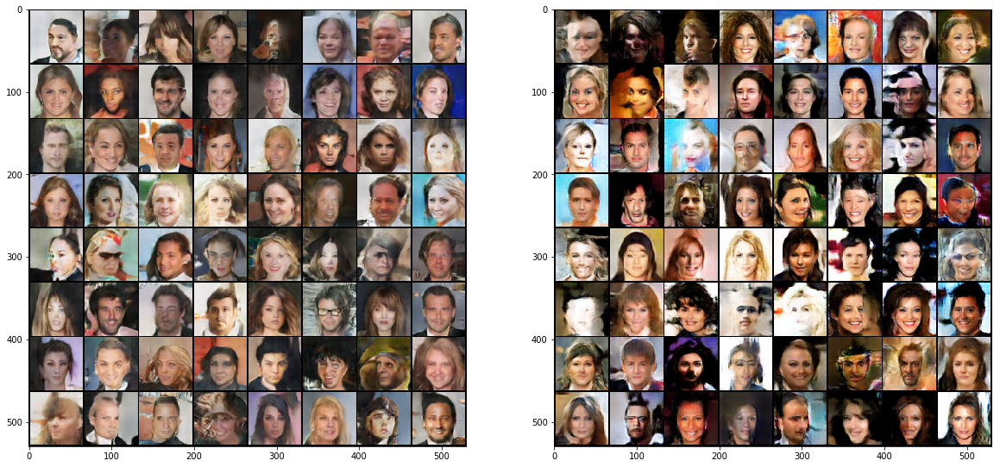

In [31]:
fig, axs = plt.subplots(1,2, figsize=(20,10))
axs[0].imshow(np.transpose(img_list[-1], (1,2,0)))
axs[1].imshow(np.transpose(img_list2[-1], (1,2,0)))

In [ ]:
fig = plt.figure(figsize = (8,8))


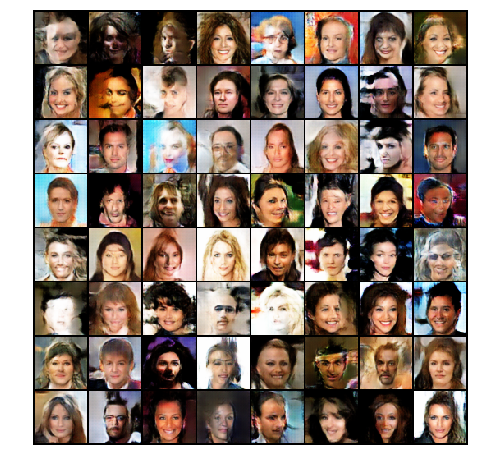

In [17]:
fig = plt.figure(figsize = (8,8))
plt.axis('off')
ims = [[plt.imshow(np.transpose(i, (1,2,0)), animated=True)] for i in img_list2]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
real_batch = next(iter(dataloader))

In [ ]:
plt.figure(figsize=(25,25))
plt.subplot(1,2,1)
plt.axis('off')
plt.title('Real Images')
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5,
                                        normalize=True).cpu(),(1,2,0)))
plt.subplot(1,2,2)
plt.axis('off')
plt.title('Fake Images')
plt.imshow(np.transpose(img_list[-1],(1,2,0)))

In [15]:
img_list = []
G_losses = []
D_losses = []
iters = 0

i = 0
it = iter(dataloader)
data = next(it)


In [16]:
data[0].size()

torch.Size([128, 3, 64, 64])

In [20]:
netD.zero_grad()
real_data = data[0].to(device)
batch_size = real_data.size(0)
label = torch.full((batch_size,), real_label, device=device)

In [35]:
output, feature = netD(real_data, feature_matching=True)

In [36]:
feature.size()

torch.Size([2048, 512])

In [37]:
output.size()

torch.Size([128, 1, 1, 1])

In [63]:
a = torch.Tensor([1,2,3])
b = torch.Tensor([4,5,6])

In [69]:
l = nn.MSELoss(reduction='elementwise_mean')
l(a, b)

tensor(9.)

In [2]:
Batch = 3
A = 5
B = 2
C = 3

In [3]:
T = np.random.randn(A*B*C)
T = torch.Tensor(T).reshape([A,B,C])

In [4]:
T.size()

torch.Size([5, 2, 3])

In [5]:
x = np.random.randn(Batch*A)
x = torch.Tensor(x).reshape([Batch,A]) #batch = 2, feature map size = 5

## Case 1: for文によるmini-batch

In [47]:
T = T.reshape([A, -1])
M = x.mm(T)
M = M.reshape(-1, B, C)

In [48]:
M

tensor([[[ 0.2810,  0.4581,  0.6934],
         [ 0.4265, -1.2554, -0.8388]],

        [[ 4.4034, -1.5264,  0.8689],
         [ 0.2460, -0.3844,  0.3895]],

        [[ 3.2429,  0.4339, -2.8828],
         [-0.5671, -1.6878,  1.0911]]])

In [49]:
out_tensor = []

In [50]:
np.exp(0)

1.0

In [51]:
for i in range(M.size()[0]):
    out_i = None
    for j in range(M.size()[0]):
        if i == j:
            continue
            
        o_i = torch.sum(torch.abs(M[i,:,:] - M[j,:,:]), 1)
        o_i = torch.exp(-o_i)
        print(o_i)
        if out_i is None:
            out_i = o_i
        else:
            out_i += o_i
    out_tensor.append(out_i)

tensor([0.0019, 0.1023])
tensor([0.0014, 0.0349])
tensor([0.0019, 0.1023])
tensor([0.0010, 0.0597])
tensor([0.0014, 0.0349])
tensor([0.0010, 0.0597])


In [52]:
out_tensor

[tensor([0.0033, 0.1372]), tensor([0.0029, 0.1620]), tensor([0.0024, 0.0946])]

In [53]:
out_T = torch.cat(tuple(out_tensor)).view(M.size()[0], B)

In [54]:
out_T.shape

torch.Size([3, 2])

## Case2: テンソル演算によるmini-batch

In [62]:
from chainer import functions as cF
import chainer

In [72]:
M_np = M.numpy()
M_np_ex = cF.expand_dims(M_np, 3)
M_np_ex_T = cF.transpose(M_np_ex, (3,1,2,0))

In [73]:
M_np_ex.shape

(3, 2, 3, 1)

In [67]:
M_np_ex, M_np_ex_T = cF.broadcast(M_np_ex, M_np_ex_T)

In [68]:
xp = chainer.cuda.get_array_module(x.numpy())
norm = cF.sum(abs(M_np_ex - M_np_ex_T), axis=2)
eraser = cF.broadcast_to(xp.eye(Batch).reshape((Batch, 1, Batch)), norm.shape)

In [69]:
c_b = cF.exp(-(norm.data + 1e6 * eraser.data))
o_b = cF.sum(c_b, axis=2)

In [70]:
o_b

variable([[0.0032814 , 0.13718147],
          [0.00290477, 0.16202009],
          [0.00244846, 0.09459406]])

In [71]:
out_T

tensor([[0.0033, 0.1372],
        [0.0029, 0.1620],
        [0.0024, 0.0946]])